# Исследование рынка заведений общественного питания Москвы

# Описание исследования

В нашем распоряжении датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер. Заказчик исследования — инвесторы из фонда «Shut Up and Take My Money», которые собираются попробовать себя в новой области и открыть заведение общественного питания в Москве.

<a href='https://drive.google.com/file/d/1JF1Ugdm3ySb1vvWKNL8R5CAaQy2IZlcW/view?usp=drive_link'>Ссылка на презентацию</a>

# Цель исследования

Подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

# Задачи исследования

1. Оценить представленные данные.
2. Выполнить предобработку данных.
3. Добавить новые столбцы в таблицу для последующего анализа.
4. Провести исследовательский анализ данных.
5. Подготовить презентацию.

# Исходные данные

Таблица moscow_places.csv содержит информацию о заведениях общественного питания Москвы и имеет следующие столбцы:

    name — название заведения;
    category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
    address — адрес заведения;
    district — административный район, в котором находится заведение, например Центральный административный округ;
    hours — информация о днях и часах работы;
    lat — широта географической точки, в которой находится заведение;
    lng — долгота географической точки, в которой находится заведение;
    rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
    price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
    avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    
    «Средний счёт: 1000–1500 ₽»;
    «Цена чашки капучино: 130–220 ₽»;
    «Цена бокала пива: 400–600 ₽».
    и так далее;
    
    middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    
    Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
    
    middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    
    Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
    
    chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    
    0 — заведение не является сетевым
    1 — заведение является сетевым
    
    
    seats — количество посадочных мест.

# Данное исследование разделим на несколько частей

## Откроем файл с данными и изучим общую информацию

### Устанавливаем и импортируем необходимые библиотеки

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import warnings
import plotly.express as px
from plotly import graph_objects as go
import plotly.io as pio
from IPython.display import Image
import json
import re

#### Установим библиотеку folium

In [2]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


#### Импортируем библиотеки folium

In [3]:
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster

#### Установим библиотеку haversine

In [4]:
pip install haversine

Note: you may need to restart the kernel to use updated packages.


#### Импортируем библиотеку haversine

In [5]:
import haversine
from haversine import haversine, Unit

#### Установим библиотеку kaleido версии 0.1.0post1

In [6]:
pip install kaleido==0.1.0post1

Note: you may need to restart the kernel to use updated packages.


### Cчитаем данные из csv-файла в датафрейм и сохраним в переменную data

In [7]:
data = pd.read_csv(r'C:\Users\Равиль\Проекты для портфолио\1. Проект по общепиту\moscow_places.csv')

### Изучим общую информацию о датафрейме

In [8]:
data.head(10).T

,0,1,2,3,4,5,6,7,8,9
name,WoWфли,Четыре комнаты,Хазри,Dormouse Coffee Shop,Иль Марко,Sergio Pizza,Огни города,Mr. Уголёк,Donna Maria,Готика
category,кафе,ресторан,кафе,кофейня,пиццерия,пиццерия,"бар,паб",быстрое питание,ресторан,кафе
address,"Москва, улица Дыбенко, 7/1","Москва, улица Дыбенко, 36, корп. 1","Москва, Клязьминская улица, 15","Москва, улица Маршала Федоренко, 12","Москва, Правобережная улица, 1Б","Москва, Ижорская улица, вл8Б","Москва, Клязьминская улица, 9, стр. 3","Москва, Клязьминская улица, 9, стр. 3","Москва, Дмитровское шоссе, 107, корп. 4","Москва, Ангарская улица, 39"
district,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ
hours,"ежедневно, 10:00–22:00","ежедневно, 10:00–22:00","пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...","ежедневно, 09:00–22:00","ежедневно, 10:00–22:00","ежедневно, 10:00–23:00",пн 15:00–04:00; вт-вс 15:00–05:00,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...","ежедневно, 10:00–22:00","ежедневно, 12:00–00:00"
lat,55.878494,55.875801,55.889146,55.881608,55.881166,55.88801,55.890752,55.890636,55.880045,55.879038
lng,37.47886,37.484479,37.525901,37.48886,37.449357,37.509573,37.524653,37.524303,37.539006,37.524487
rating,5.0,4.5,4.6,5.0,5.0,4.6,4.4,4.7,4.8,4.3
price,NaN,выше среднего,средние,NaN,средние,средние,средние,средние,средние,средние
avg_bill,NaN,Средний счёт:1500–1600 ₽,Средний счёт:от 1000 ₽,Цена чашки капучино:155–185 ₽,Средний счёт:400–600 ₽,NaN,Средний счёт:199 ₽,Средний счёт:200–300 ₽,Средний счёт:от 500 ₽,Средний счёт:1000–1200 ₽


### Выведем основную информацию о датафрейме

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


### Оценим количество уникальных названий заведений по столбцу name

In [10]:
data['name'].nunique()

5614

### Выводы по 1 разделу

Таблица содержит 14 столбцов в которой имеются целые, вещественные числа и строки.
1. Типом данных в столбцах name, category, address, district, hours, price, avg_bill являются строки.
2. Типом данных в столбцах lat, lng, rating, middle_avg_bill, middle_coffee_cup, seats ялвются вещественные или дробные числа.
3. Типом данных в столбце chain ялвяются целые числа.

Учитывая типы данных в столбцах для последующего анализа потребуется преобразование в некоторых из них.
В датафремйе представлено 5614 уникальных заведений общественного питания. Количество значений в каждом столбце не однинаковое. Значит имеются пропуски. Будем их обрабатывать.

## Предобработка данных

### Изучение и обработка пропусков

#### Опеределим сколько всего есть пропущенных значений в каждом столбце

In [11]:
data.isna().sum().sort_values(ascending=False)

middle_coffee_cup    7871
middle_avg_bill      5257
price                5091
avg_bill             4590
seats                3611
hours                 536
name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
dtype: int64

#### Оценим сколько пропущено значений в столбцах в процентах от общего количества

In [12]:
round(data.isna().mean().sort_values(ascending=False) * 100, 2)

middle_coffee_cup    93.64
middle_avg_bill      62.54
price                60.56
avg_bill             54.60
seats                42.96
hours                 6.38
name                  0.00
category              0.00
address               0.00
district              0.00
lat                   0.00
lng                   0.00
rating                0.00
chain                 0.00
dtype: float64

#### Оценим в каких строках есть пропущенные значения в столбце middle_coffee_cup

In [13]:
data.loc[data['middle_coffee_cup'].isna()].head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0
10,Great Room Bar,"бар,паб","Москва, Левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,NaN,NaN,0,102.0


#### Оценим какие есть уникальные значения столбца avg_bill где значения столбца middle_coffee_cup явлются пропущенными, используя list comprehension

In [14]:
unique_avg_bill_coffee = data[data['middle_coffee_cup'].isnull()]['avg_bill'].unique()
unique_avg_bill_coffee_str = [str(value) for value in unique_avg_bill_coffee if not pd.isnull(value)]
sorted(unique_avg_bill_coffee_str)[:10]

['Средний счёт:100 ₽',
 'Средний счёт:1000 ₽',
 'Средний счёт:1000–10000 ₽',
 'Средний счёт:1000–1100 ₽',
 'Средний счёт:1000–1200 ₽',
 'Средний счёт:1000–1300 ₽',
 'Средний счёт:1000–1350 ₽',
 'Средний счёт:1000–1400 ₽',
 'Средний счёт:1000–1500 ₽',
 'Средний счёт:1000–1600 ₽']

#### Оценим в каких строках есть пропущенные значения в столбце middle_avg_bill

In [15]:
data.loc[data['middle_avg_bill'].isna()].head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
10,Great Room Bar,"бар,паб","Москва, Левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,NaN,NaN,0,102.0
11,Шашлык Шефф,кафе,"Москва, улица Маршала Федоренко, 10с1",Северный административный округ,"ежедневно, 10:00–21:00",55.881770,37.492362,4.9,NaN,NaN,NaN,NaN,0,NaN
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0
19,Пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN
20,Чебуреки Манты,кафе,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880287,37.448646,4.3,NaN,NaN,NaN,NaN,1,148.0
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN
22,Крымские чебуреки,кафе,"Москва, Коровинское шоссе, 35, стр. 17",Северный административный округ,пн-пт 09:00–21:00,55.883414,37.514572,4.2,NaN,NaN,NaN,NaN,0,NaN


#### Оценим какие есть уникальные значения столбца avg_bill где значения столбца middle_avg_bill явлются пропущенными, используя list comprehension

In [16]:
unique_avg_bill = data[data['middle_avg_bill'].isnull()]['avg_bill'].unique()
unique_avg_bill_str = [str(value) for value in unique_avg_bill if not pd.isnull(value)]
sorted(unique_avg_bill_str)[:10]

['Цена бокала пива:100–250 ₽',
 'Цена бокала пива:120–350 ₽',
 'Цена бокала пива:129–319 ₽',
 'Цена бокала пива:130–150 ₽',
 'Цена бокала пива:140–190 ₽',
 'Цена бокала пива:140–330 ₽',
 'Цена бокала пива:140–420 ₽',
 'Цена бокала пива:150 ₽',
 'Цена бокала пива:150–180 ₽',
 'Цена бокала пива:150–230 ₽']

#### Оценим в каких строках есть пропущенные значения в столбце price

In [17]:
data.loc[data['price'].isna()].head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
11,Шашлык Шефф,кафе,"Москва, улица Маршала Федоренко, 10с1",Северный административный округ,"ежедневно, 10:00–21:00",55.881770,37.492362,4.9,NaN,NaN,NaN,NaN,0,NaN
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0
19,Пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN
20,Чебуреки Манты,кафе,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880287,37.448646,4.3,NaN,NaN,NaN,NaN,1,148.0
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN
22,Крымские чебуреки,кафе,"Москва, Коровинское шоссе, 35, стр. 17",Северный административный округ,пн-пт 09:00–21:00,55.883414,37.514572,4.2,NaN,NaN,NaN,NaN,0,NaN
23,Буханка,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN
24,Drive Café,кафе,"Москва, улица Дыбенко, 9Ас1",Северный административный округ,"ежедневно, круглосуточно",55.879992,37.481571,4.0,NaN,NaN,NaN,NaN,1,NaN


#### Оценим в каких строках есть пропущенные значения в столбце avg_bill

In [18]:
data.loc[data['avg_bill'].isna()].head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
11,Шашлык Шефф,кафе,"Москва, улица Маршала Федоренко, 10с1",Северный административный округ,"ежедневно, 10:00–21:00",55.881770,37.492362,4.9,NaN,NaN,NaN,NaN,0,NaN
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0
19,Пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN
20,Чебуреки Манты,кафе,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880287,37.448646,4.3,NaN,NaN,NaN,NaN,1,148.0
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN
22,Крымские чебуреки,кафе,"Москва, Коровинское шоссе, 35, стр. 17",Северный административный округ,пн-пт 09:00–21:00,55.883414,37.514572,4.2,NaN,NaN,NaN,NaN,0,NaN
23,Буханка,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN
24,Drive Café,кафе,"Москва, улица Дыбенко, 9Ас1",Северный административный округ,"ежедневно, круглосуточно",55.879992,37.481571,4.0,NaN,NaN,NaN,NaN,1,NaN


#### Оценим в каких строках есть пропущенные значения в столбце seats

In [19]:
data.loc[data['seats'].isna()].head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
11,Шашлык Шефф,кафе,"Москва, улица Маршала Федоренко, 10с1",Северный административный округ,"ежедневно, 10:00–21:00",55.881770,37.492362,4.9,NaN,NaN,NaN,NaN,0,NaN
12,Заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,0,NaN
14,У Сильвы,"бар,паб","Москва, Ангарская улица, 42с1",Северный административный округ,"ежедневно, 13:00–00:00",55.885528,37.528371,4.2,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,0,NaN
16,База Стритфуд,кафе,"Москва, Базовская улица, 15, корп. 8",Северный административный округ,"ежедневно, 10:00–23:00",55.877859,37.507754,4.2,средние,Средний счёт:140–350 ₽,245.0,NaN,0,NaN
19,Пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN
22,Крымские чебуреки,кафе,"Москва, Коровинское шоссе, 35, стр. 17",Северный административный округ,пн-пт 09:00–21:00,55.883414,37.514572,4.2,NaN,NaN,NaN,NaN,0,NaN


#### Оценим в каких строках есть пропущенные значения в столбце hours

In [20]:
data.loc[data['hours'].isna()].head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
38,Ижора,булочная,"Москва, Ижорский проезд, 5А",Северный административный округ,NaN,55.888366,37.514856,4.4,NaN,NaN,NaN,NaN,0,NaN
40,Кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.895115,37.524902,3.7,NaN,NaN,NaN,NaN,0,NaN
44,Кафетерий,кафе,"Москва, Ангарская улица, 24А",Северный административный округ,NaN,55.876289,37.519315,3.8,NaN,NaN,NaN,NaN,1,8.0
56,Рыба из тандыра,быстрое питание,"Москва, Коровинское шоссе, 46, стр. 5",Северный административный округ,NaN,55.888010,37.515960,1.5,NaN,NaN,NaN,NaN,0,NaN
108,Кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,0,NaN
123,Кафе,кафе,"Москва, Шенкурский проезд, 14",Северо-Восточный административный округ,NaN,55.897794,37.591395,4.3,NaN,NaN,NaN,NaN,0,50.0
126,Кулинария,кафе,"Москва, Череповецкая улица, 17",Северо-Восточный административный округ,NaN,55.898741,37.585301,3.9,NaN,NaN,NaN,NaN,1,NaN
138,Хинкальная,быстрое питание,"Москва, Шенкурский проезд, 14",Северо-Восточный административный округ,NaN,55.897751,37.591363,4.1,NaN,NaN,NaN,NaN,1,50.0
217,16 Июня,кафе,"Москва, бульвар Академика Ландау, 3",Северо-Восточный административный округ,NaN,55.920370,37.552150,1.4,NaN,NaN,NaN,NaN,0,NaN
274,Чайхана,кафе,"Москва, Широкая улица, 12",Северо-Восточный административный округ,NaN,55.886840,37.659610,3.0,NaN,NaN,NaN,NaN,1,50.0


#### Причины появления пропусков данных

В исходном датафрейме пропущенные значения могут быть вызваны различными причинами:

1. Пропуски в столбце middle_coffee_cup связаны с тем, что не для всех заведений общественного питания известна цена чашки кофе, а также пропусками в исходном столбце avg_bill.
2. Пропуски в столбце middle_avg_bill связаны с тем, что не для всех заведений общественного питания известен средний счёт, а также пропусками в исходном столбце avg_bill.
3. Пропуски в столбцах price, avg_bill, seats, hours могут быть связаны с тем, что информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Исходя из этого пользователи могли просто не внести все данные.
4. Некоторые значения могут быть пропущены случайно, например, из-за ошибок при вводе данных или при экспорте данных из других источников. Неправильный запрос, объединение таблиц также может быть причиной.

Чтобы точно определить причины пропусков в данных, необходимо провести более детальный анализ данных и обратиться к источнику данных.

#### Решение по заполнению пропусков

Учитывая название и содержание столбцов с пропущенными значениями, логичной замены пропусков здесь предположить невозможно, так как какой-либо очевидной связи между столбцами нет. А где связь есть, например между столбцами avg_bill, middle_avg_bill и middle_coffee_cup существуют закономерные пропуски исходя из описания данных. Таким образом, исходя из анализа, нет ситуации кодга в столбце avg_bill есть информация по среднему счету или средней цене чашки кофе и этой информации нет в столбцах middle_avg_bill и middle_coffee_cup.

### Изучение дубликатов в датафрейме

#### Проверим есть ли явные дубликаты в датафрейме

In [21]:
data.duplicated().sum()

0

Явных дубликатов c полным совпадением строк в датафрейме нет. Оценим какие есть дубликаты в отдельных столбцах. 

#### Проверим есть ли явные дубликаты в названиях заведений по столбцу name

In [22]:
data['name'].duplicated().sum()

2792

#### Приведем названия заведений в столбце name к нижему регистру

In [23]:
data['name'] = data['name'].str.lower()

#### Приведем адреса заведений в столбце address к нижему регистру

In [24]:
data['address'] = data['address'].str.lower()

#### Проверим есть ли явные дубликаты в названиях заведений по столбцу name после преобразований

In [25]:
data['name'].duplicated().sum()

2894

#### Проверим есть ли явные дубликаты одновременно по столбцам name и address

In [26]:
data.duplicated(subset=['name', 'address']).sum()

4

#### Оценим какие есть явные дубликаты одновременно по столбцам name и address

In [27]:
data[data.duplicated(subset=['name', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Анализ дубликатов по столбцам name и address показывает, что оба заведения с назаванием "кафе" с идексами строк 189 и 215 реально существуют, не смотря, что у них один и тот же адрес, так как географические координаты данных заведений ведут к двум разным заведениям, находящимся в разных местах на берегу Большого Ангарского пруда. При этом в заведениях more poke, раковарня клешни и хвосты и хлеб да выпечка действительно являются дубликатами, так как по данному адрсеу присутствует только одно заведение с таким названием.

#### Удалим из датафрейма data строки с индексами 1511, 2420, 3109 и пересчитаем индексы строк после удаления

In [28]:
data = data.drop([1511, 2420, 3109]).reset_index(drop=True)

#### Приведем первый символ строки названия заведений в столбце name к верхнему регистру и оценим результат преобразования

In [29]:
data['name'] = data['name'].str.capitalize()
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,Wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio pizza,пиццерия,"москва, ижорская улица, вл8б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","москва, клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. уголёк,быстрое питание,"москва, клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna maria,ресторан,"москва, дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"москва, ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


#### Приведем первые символы в словах в столбце address к верхнему регистру и оценим результат преобразования

In [30]:
data['address'] = data['address'].str.title()
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,Wowфли,кафе,"Москва, Улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, Улица Дыбенко, 36, Корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская Улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse coffee shop,кофейня,"Москва, Улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль марко,пиццерия,"Москва, Правобережная Улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio pizza,пиццерия,"Москва, Ижорская Улица, Вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская Улица, 9, Стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. уголёк,быстрое питание,"Москва, Клязьминская Улица, 9, Стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna maria,ресторан,"Москва, Дмитровское Шоссе, 107, Корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская Улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


#### Разобьем каждое значение столбца address на отдельные слова

##### Компилируем шаблон регулярного выражения, который соответствует хотя бы одному или нескольким символам пробела

In [31]:
regex = re.compile('\s+')

##### Преобразуем значения столбца street в одну строку

In [32]:
addresses = ' '.join(data['address'])

##### Разобьем список значений столбца street на отдельные слова и проверим результат разделения

In [33]:
unique_words = re.split('\s+', addresses)
unique_words[:10]

['Москва,',
 'Улица',
 'Дыбенко,',
 '7/1',
 'Москва,',
 'Улица',
 'Дыбенко,',
 '36,',
 'Корп.',
 '1']

#### Объединеним все строки в одну и оценим результат объединения

In [34]:
all_addresses = ' '.join(unique_words)
all_addresses[:500]

'Москва, Улица Дыбенко, 7/1 Москва, Улица Дыбенко, 36, Корп. 1 Москва, Клязьминская Улица, 15 Москва, Улица Маршала Федоренко, 12 Москва, Правобережная Улица, 1Б Москва, Ижорская Улица, Вл8Б Москва, Клязьминская Улица, 9, Стр. 3 Москва, Клязьминская Улица, 9, Стр. 3 Москва, Дмитровское Шоссе, 107, Корп. 4 Москва, Ангарская Улица, 39 Москва, Левобережная Улица, 12 Москва, Улица Маршала Федоренко, 10С1 Москва, Мкад, 80-Й Километр, 1 Москва, Базовская Улица, 15, Корп. 1 Москва, Ангарская Улица, 42С1'

#### Найдем все уникальные слова и посчитаем их количество

In [35]:
unique_words = pd.Series(re.findall(r'\w+', all_addresses)).value_counts()
unique_words.head(10)

Москва      8403
Улица       4935
1           1646
Стр         1571
Корп        1263
2           1125
Проспект     980
Шоссе        684
3            570
Проезд       443
dtype: int64

#### Удалим из списка all_addresses все числа

In [36]:
all_addresses = re.sub(r'\d+', '', all_addresses)
all_addresses[:500]

'Москва, Улица Дыбенко, / Москва, Улица Дыбенко, , Корп.  Москва, Клязьминская Улица,  Москва, Улица Маршала Федоренко,  Москва, Правобережная Улица, Б Москва, Ижорская Улица, ВлБ Москва, Клязьминская Улица, , Стр.  Москва, Клязьминская Улица, , Стр.  Москва, Дмитровское Шоссе, , Корп.  Москва, Ангарская Улица,  Москва, Левобережная Улица,  Москва, Улица Маршала Федоренко, С Москва, Мкад, -Й Километр,  Москва, Базовская Улица, , Корп.  Москва, Ангарская Улица, С Москва, Улица Бусиновская Горка,  '

#### Найдем все уникальные слова и посчитаем их количество

In [37]:
unique_words = pd.Series(re.findall(r'\w+', all_addresses)).value_counts()
unique_words.head(10)

Москва      8403
Улица       4935
Стр         1571
Корп        1263
Проспект     980
А            779
С            755
Шоссе        684
Проезд       443
Переулок     439
dtype: int64

#### Удалим из списка all_addresses все числа

In [38]:
all_addresses = re.sub(r'\b\t?\w\t?\b', '', all_addresses)
all_addresses[:500]

'Москва, Улица Дыбенко, / Москва, Улица Дыбенко, , Корп.  Москва, Клязьминская Улица,  Москва, Улица Маршала Федоренко,  Москва, Правобережная Улица,  Москва, Ижорская Улица, ВлБ Москва, Клязьминская Улица, , Стр.  Москва, Клязьминская Улица, , Стр.  Москва, Дмитровское Шоссе, , Корп.  Москва, Ангарская Улица,  Москва, Левобережная Улица,  Москва, Улица Маршала Федоренко,  Москва, Мкад, - Километр,  Москва, Базовская Улица, , Корп.  Москва, Ангарская Улица,  Москва, Улица Бусиновская Горка,  Моск'

#### Найдем все уникальные слова и посчитаем их количество

In [39]:
unique_words = pd.Series(re.findall(r'\w+', all_addresses)).value_counts()
unique_words.head(10)

Москва      8403
Улица       4935
Стр         1571
Корп        1263
Проспект     980
Шоссе        684
Проезд       443
Переулок     439
Бульвар      341
Большая      256
dtype: int64

#### Заменим в значениях столбца address слова, которые по смыслу должны начинаться с маленьких букв и оценим результат преобразований

In [40]:
data['address'] = data['address'].replace({
    'Улица' : 'улица',
    'Стр' : 'cтр',
    'Корп' : 'корп',
    'Проспект' : 'проспект',
    'Шоссе' : 'шоссе',
    'Проезд' : 'проезд',
    'Переулок' : 'переулок',
    'Бульвар' : 'бульвар',
    'Большая' : 'большая',
    'Площадь' : 'площадь',
    'Набережная' : 'набережная',
    'Вал' : 'вал',
    'Округ' : 'округ',
    'Большой' : 'большой',
    'Километр' : 'километр',
    'Мкад' : 'МКАД',
    'Парк' : 'парк',
    'Нижняя' : 'нижняя',
    'Верхняя' : 'верхняя'}, regex=True)

#### Оценим результат преобразований после замены значений в столбце address

In [41]:
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,Wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio pizza,пиццерия,"Москва, Ижорская улица, Вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, cтр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. уголёк,быстрое питание,"Москва, Клязьминская улица, 9, cтр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


#### Оценим какие есть явные дубликаты в названиях заведений по столбцу name

In [42]:
data.loc[data['name'].duplicated(keep=False)].head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
4,Иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0
19,Пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN
20,Чебуреки манты,кафе,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880287,37.448646,4.3,NaN,NaN,NaN,NaN,1,148.0
23,Буханка,булочная,"Москва, Лобненская улица, 13К2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN
24,Drive café,кафе,"Москва, улица Дыбенко, 9Ас1",Северный административный округ,"ежедневно, круглосуточно",55.879992,37.481571,4.0,NaN,NaN,NaN,NaN,1,NaN
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN
29,Кушай город,столовая,"Москва, Дмитровское шоссе, 157, cтр. 15",Северный административный округ,пн-пт 09:00–16:00,55.898414,37.539256,4.2,средние,Средний счёт:200–250 ₽,225.0,NaN,1,NaN
32,Додо пицца,пиццерия,"Москва, Коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,NaN,Средний счёт:328 ₽,328.0,NaN,1,46.0
34,Домино'с пицца,пиццерия,"Москва, Клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.886963,37.523518,4.2,NaN,Средний счёт:от 500 ₽,500.0,NaN,1,247.0


#### Оценим количество строк значений столбца name с названием Кафе

In [43]:
data['name'].loc[data['name'] == 'Кафе'].count()

189

#### Оценим какие уникальные значения столбца chain есть для строк где заведение называется Кафе

In [44]:
data[data['name'] == 'Кафе']['chain'].unique()

array([0], dtype=int64)

#### Оценим какие есть неявные дубликаты в названиях заведений по столбцу name

In [45]:
sorted(list(data['name'].unique()))[:10]

['#кешбэккафе',
 '+39 pizzeria mozzarella bar',
 '1 этаж',
 '1-я креветочная',
 '10 идеальных пицц',
 '1001 ночь',
 '100ловая',
 '100лоффка',
 '13',
 '13 chef doner']

#### Оценим какие есть неявные дубликаты в категориях заведений по столбцу category

In [46]:
sorted(list(data['category'].unique()))[:10]

['бар,паб',
 'булочная',
 'быстрое питание',
 'кафе',
 'кофейня',
 'пиццерия',
 'ресторан',
 'столовая']

#### Заменим в значениях столбца category строку бар,паб на бар-паб

In [47]:
data['category'] = data['category'].str.replace('бар,паб', 'бар-паб')

#### Оценим уникальные значения категорий заведений по столбцу category после замены

In [48]:
sorted(list(data['category'].unique()))[:10]

['бар-паб',
 'булочная',
 'быстрое питание',
 'кафе',
 'кофейня',
 'пиццерия',
 'ресторан',
 'столовая']

#### Оценим какие есть неявные дубликаты в адресах заведений по столбцу address

In [49]:
sorted(list(data['address'].unique()))[:10]

['Москва, 1-Й cтрелецкий проезд, 14',
 'Москва, 1-Й cтрелецкий проезд, 14/21',
 'Москва, 1-Й Автозаводский проезд, 5',
 'Москва, 1-Й Балтийский переулок, 3/25',
 'Москва, 1-Й Варшавский проезд, 1Ас9',
 'Москва, 1-Й Вешняковский проезд, 15',
 'Москва, 1-Й Волоколамский проезд, 10',
 'Москва, 1-Й Волоколамский проезд, 10, cтр. 1',
 'Москва, 1-Й Голутвинский переулок, 6',
 'Москва, 1-Й Грайвороновский проезд, 2А']

#### Оценим какие есть неявные дубликаты в административных районах по столбцу district

In [50]:
sorted(list(data['district'].unique()))[:10]

['Восточный административный округ',
 'Западный административный округ',
 'Северный административный округ',
 'Северо-Восточный административный округ',
 'Северо-Западный административный округ',
 'Центральный административный округ',
 'Юго-Восточный административный округ',
 'Юго-Западный административный округ',
 'Южный административный округ']

#### Оценим какие есть неявные дубликаты в днях и часах работы заведений по столбцу hours, используя list comprehension

In [51]:
unique_hours = data['hours'].unique()
unique_hours_str = [str(value) for value in unique_hours if not pd.isnull(value)]
sorted(unique_hours_str)[:10]

['Нет информации',
 'вт 08:30–17:00; ср,чт 12:00–20:30; пт 08:30–17:00; сб 09:00–16:30',
 'вт 13:00–21:00; ср 11:00–20:00; чт 13:00–21:00; пт-вс 11:00–20:00',
 'вт,чт 10:00–18:00',
 'вт,чт,пт,сб,вс 08:00–23:00',
 'вт-вс 09:00–19:00',
 'вт-вс 09:00–21:00',
 'вт-вс 10:00–18:00',
 'вт-вс 10:00–20:00',
 'вт-вс 10:00–21:00']

#### Напишем функцию sort_unique_values, которая будет выполнять сортировку уникальных значений для столбцов где есть разные типы данных и проверим ее работу

In [52]:
def sort_unique_values(column, n):
    unique_values = data[column].unique()
    unique_values_str = [str(value) for value in unique_values if not pd.isnull(value)]
    display(sorted(unique_values_str)[:n])

sort_unique_values('hours', 10)

['Нет информации',
 'вт 08:30–17:00; ср,чт 12:00–20:30; пт 08:30–17:00; сб 09:00–16:30',
 'вт 13:00–21:00; ср 11:00–20:00; чт 13:00–21:00; пт-вс 11:00–20:00',
 'вт,чт 10:00–18:00',
 'вт,чт,пт,сб,вс 08:00–23:00',
 'вт-вс 09:00–19:00',
 'вт-вс 09:00–21:00',
 'вт-вс 10:00–18:00',
 'вт-вс 10:00–20:00',
 'вт-вс 10:00–21:00']

#### Оценим какие есть неявные дубликаты в категориях цен в заведении по столбцу price, использую ранее созданную функцию sort_unique_values

In [53]:
sort_unique_values('price', 10)

['высокие', 'выше среднего', 'низкие', 'средние']

#### Оценим какие есть неявные дубликаты по столбцу avg_bill, использую ранее созданную функцию sort_unique_values

In [54]:
sort_unique_values('avg_bill', 10)

['Средний счёт:100 ₽',
 'Средний счёт:1000 ₽',
 'Средний счёт:1000–10000 ₽',
 'Средний счёт:1000–1100 ₽',
 'Средний счёт:1000–1200 ₽',
 'Средний счёт:1000–1300 ₽',
 'Средний счёт:1000–1350 ₽',
 'Средний счёт:1000–1400 ₽',
 'Средний счёт:1000–1500 ₽',
 'Средний счёт:1000–1600 ₽']

#### Выводы по изучению дубликатов

Явных дубликатов с полным совпадением по всем строкам найдено не было. После проведенного анализа также было удалены 3 строки с однозначными дубликатами. В столбце с названиями заведений есть дубликаты, но их появление закономерно и связано с тем, что есть сетевые заведения общественного питания где значение столбца chain = 1. Также было найдено 189 не сетевых заведений с названием "Кафе", где значение столбца chain = 0. Очевидно, что это не уникальные названия заведений, которые могут носить заведения, не имеющие своего бренда. Неявных дубликатов в стобцах category, address, district, hours,  price, avg_bill где имеются строковые значения найдено не было.

### Добавление новых столбцов

#### Создадим новый столбец street - с названиями улиц из столбца с address и оценим результат добавления в датафрейм

In [55]:
data['street'] = data['address'].apply(lambda x: x.split(',')[1].strip() if isinstance(x, str) else x)
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,Wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица
5,Sergio pizza,пиццерия,"Москва, Ижорская улица, Вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,Ижорская улица
6,Огни города,бар-паб,"Москва, Клязьминская улица, 9, cтр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,Клязьминская улица
7,Mr. уголёк,быстрое питание,"Москва, Клязьминская улица, 9, cтр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,Клязьминская улица
8,Donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,Ангарская улица


#### Оценим какие есть уникальные значения о днях и часах работы по столбцу hours, где присутствует слово круглосуточно

In [56]:
unique_values_hours = data[data['hours'].str.contains('круглосуточно', na=False)]['hours'].unique()
sorted(unique_values_hours)[:10]

['вт-вс круглосуточно',
 'ежедневно, круглосуточно',
 'пн 00:01–12:00, перерыв 12:00–13:30; вт-чт 13:30–12:00; пт 13:30–00:00; сб,вс круглосуточно',
 'пн 06:00–00:00; вт-вс круглосуточно',
 'пн 08:00–23:00; вт-вс круглосуточно',
 'пн 08:00–23:00; вт-пт 08:00–00:00; сб круглосуточно; вс 00:00–23:00',
 'пн 10:00–00:00; вт-сб круглосуточно; вс 00:00–23:00',
 'пн круглосуточно; вт-чт 12:00–00:00; пт 12:00–02:00; сб 11:00–02:00; вс 14:00–00:00',
 'пн,вт 07:30–23:00; ср-вс круглосуточно',
 'пн,вт 08:00–22:00; ср,чт 08:00–23:00; пт,сб круглосуточно; вс 00:00–22:00']

#### Напишем функцию categorize_hours для разделения на следующие категории:
    логическое значение True — если заведение работает ежедневно и круглосуточно;
    логическое значение False — в противоположном случае.

In [57]:
def categorize_hours(row):
    if isinstance(row, str) and 'ежедневно, круглосуточно' in row:
        return True
    return False

#### Применим функцию categorize_hours для добавления столбца is_24/7 и оценим результат добавления в датафрейм

In [58]:
data['is_24/7'] = data['hours'].apply(categorize_hours)
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,Wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
5,Sergio pizza,пиццерия,"Москва, Ижорская улица, Вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,Ижорская улица,False
6,Огни города,бар-паб,"Москва, Клязьминская улица, 9, cтр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,Клязьминская улица,False
7,Mr. уголёк,быстрое питание,"Москва, Клязьминская улица, 9, cтр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,Клязьминская улица,False
8,Donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,Ангарская улица,False


## Исследовательский анализ данных

### Исследование категории заведений

#### Построим сводную таблицу методом crosstab() со следующими столбцами:
    category - категория заведения
    count_public_food - количество заведений по категориям
    count_public_food_percent - количество заведений по категориям в процентах от общего количества

In [59]:
data_crosstab_public_food = pd.crosstab(index=data['category'], columns=['count_public_food']).reset_index()
data_crosstab_public_food['count_public_food_percent'] = round((data_crosstab_public_food['count_public_food'] /\
                                                              data['category'].count()) * 100, 2)
data_crosstab_public_food

col_0,category,count_public_food,count_public_food_percent
0,бар-паб,764,9.09
1,булочная,256,3.05
2,быстрое питание,603,7.18
3,кафе,2377,28.29
4,кофейня,1413,16.82
5,пиццерия,633,7.53
6,ресторан,2042,24.30
7,столовая,315,3.75


#### Отсортируем сводную таблицу data_crosstab_public_food по количеству заведений по категориям

In [60]:
sorted_public_food = data_crosstab_public_food.sort_values(by='count_public_food',
                                                                   ascending=False).reset_index(drop=True)
sorted_public_food

col_0,category,count_public_food,count_public_food_percent
0,кафе,2377,28.29
1,ресторан,2042,24.30
2,кофейня,1413,16.82
3,бар-паб,764,9.09
4,пиццерия,633,7.53
5,быстрое питание,603,7.18
6,столовая,315,3.75
7,булочная,256,3.05


#### Построим круговую диаграмму распределения количества заведений по категориям по данным сводной таблицы sorted_public_food

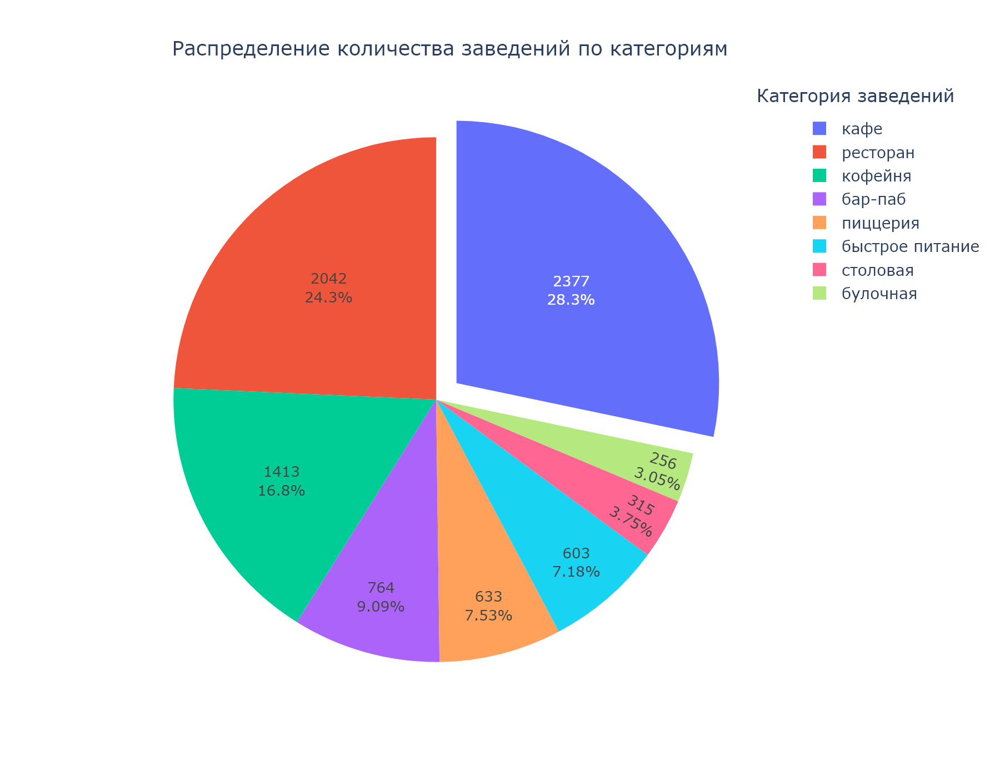

In [61]:
sorted_public_food['text'] = sorted_public_food.apply(lambda x: f'{x["count_public_food"]:.0f}', axis=1)
fig = go.Figure(data=[go.Pie(labels=sorted_public_food['category'],
                             values=sorted_public_food['count_public_food'],
                             text=sorted_public_food['text'],
                             pull = [0.1, 0])])
fig.update_layout(title='Распределение количества заведений по категориям', width=900, height=700, title_x=0.45,
                  font_size=13, title_font_size=18, legend_font_size=14, annotations=[dict(x=1.25, y=1.05,
                  text='Категория заведений', showarrow=False)])
fig.update_annotations(font_size=16)
pio.write_image(fig, 'figure.png', width=900, height=700, scale=2)
Image('figure.png')

#### Построим столбчатую диаграмму распределения количества заведений по категориям по данным сводной таблицы sorted_public_food

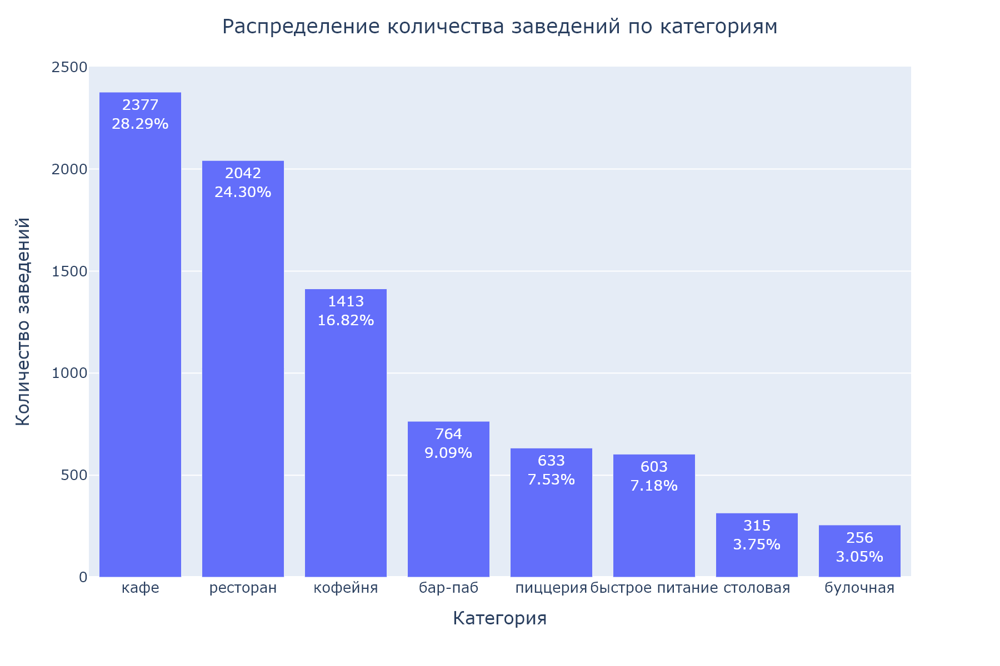

In [62]:
sorted_public_food['text'] = sorted_public_food.apply(lambda x: \
                                        f'{x["count_public_food"]:.0f}<br>{x["count_public_food_percent"]:.2f}%', axis=1)
fig = px.bar(sorted_public_food,
             x='category',
             y='count_public_food',
             text='text')
fig.update_layout(title='Распределение количества заведений по категориям', title_x=0.5,
                  xaxis_title='Категория',
                  yaxis_title='Количество заведений',
                  width=990,
                  height=600,
                  font_size=13)
pio.write_image(fig, 'figure.png', width=900, height=600, scale=2)
Image('figure.png')

#### Выводы по распределению количества заведений по категориям

В датафрейме представлены 8 категорий заведений общественного питания: кафе, ресторан, кофейня, бар-паб, пиццерия, быстрое питание, столовая, булочная. Среди них выделяются 3 крупные категории: кафе - 2377 заведений или 28.29%, рестораны - 2042 заведения или 24.3%, кофейни - 1413 заведений или 16.82%. Доля остальных категорий заведений не превышает 10%.

### Исследование количества посадочных мест по категориям заведений

#### Построим гистограмму количества посадочных мест заведений по столбцу seats

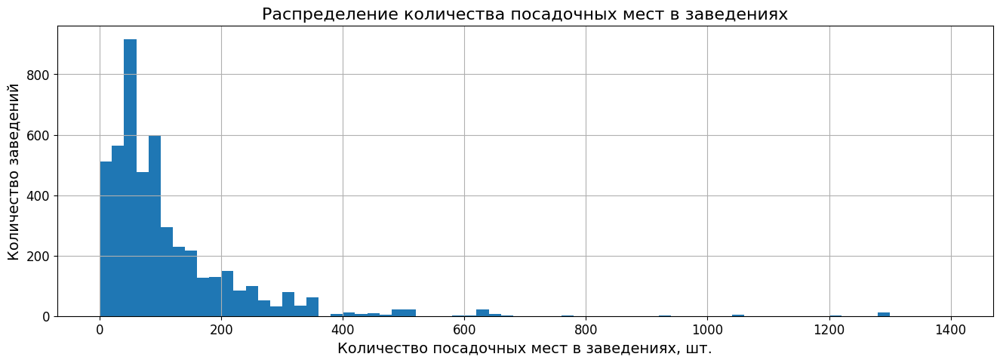

In [63]:
data['seats'].hist(figsize=(16, 5), bins=70, range=(0, 1400))
plt.xlabel('Количество посадочных мест в заведениях, шт.', fontsize=14)
plt.ylabel('Количество заведений', fontsize=14)
plt.title('Распределение количества посадочных мест в заведениях', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

#### Оценим общие числовые характеристики количества посадочных мест заведений по столбцу seats

In [64]:
data['seats'].describe()

count    4792.000000
mean      108.361436
std       122.841130
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

#### Построим диаграмму размаха количества посадочных мест по столбцу seats

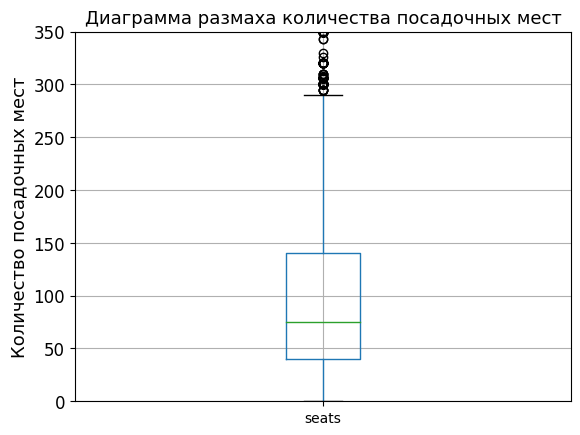

In [65]:
plt.ylim(0, 350)
data.boxplot('seats')
plt.title('Диаграмма размаха количества посадочных мест', fontsize=13)
plt.ylabel('Количество посадочных мест', fontsize=13)
plt.yticks(fontsize=12)
plt.show()

#### Оценим количество заведений где количество посадочных заведениях равно нулю

In [66]:
data['seats'].loc[data['seats'] == 0].count()

136

#### Оценим в каких заведениях количество посадочных заведениях равно нулю

In [67]:
data.query('seats == 0').head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
84,Meat doner kebab,булочная,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896987,37.608126,4.5,NaN,Средний счёт:300 ₽,300.0,NaN,0,0.0,улица Лескова,True
177,Арамье,булочная,"Москва, улица 800-Летия Москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.879392,37.556832,4.0,NaN,NaN,NaN,NaN,1,0.0,улица 800-Летия Москвы,False
196,Донер-шашлык,ресторан,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896962,37.608300,4.5,NaN,NaN,NaN,NaN,0,0.0,улица Лескова,True
203,Тандыр № 1,кафе,"Москва, улица Лескова, 22Г",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.895615,37.611049,4.0,NaN,NaN,NaN,NaN,1,0.0,улица Лескова,True
211,Неаполитан пицца,кафе,"Москва, улица Пришвина, 23",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.885416,37.604650,4.3,NaN,NaN,NaN,NaN,0,0.0,улица Пришвина,False
266,Пекарня&донер,булочная,"Москва, Широкая улица, 21",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.887751,37.672475,4.1,NaN,NaN,NaN,NaN,0,0.0,Широкая улица,True
284,Центр плов,кафе,"Москва, Широкая улица, 16А",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.887348,37.662315,4.2,NaN,NaN,NaN,NaN,0,0.0,Широкая улица,True
290,Шаурма,кафе,"Москва, Осташковская улица, 7, корп. 1",Северо-Восточный административный округ,NaN,55.877350,37.679414,3.3,NaN,NaN,NaN,NaN,0,0.0,Осташковская улица,False
306,Everest coffee,кофейня,"Москва, Сходненская улица, 50",Северо-Западный административный округ,"пн-чт 08:00–22:00; пт 08:00–23:00; сб,вс 09:00...",55.847770,37.440586,4.9,средние,Цена чашки капучино:200–300 ₽,NaN,250.0,0,0.0,Сходненская улица,False
337,Пекарня маковка,пиццерия,"Москва, Сходненская улица, 35, корп. 1",Северо-Западный административный округ,"ежедневно, 08:00–22:00",55.848505,37.439135,4.9,NaN,NaN,NaN,NaN,0,0.0,Сходненская улица,False


#### Построим сводную таблицу методом pivot_table() со следующими столбцами:
    category - категория заведения
    seats_sum - количество посадочных мест по категориям
    seats_median - медиана количества посадочных мест по категориям
    seats_sum_percent - количество посадочных мест по категориям в процентах от общего количества

In [68]:
data_pivot_seats = data.pivot_table(index='category', values='seats', aggfunc=['sum', 'median']).reset_index()
data_pivot_seats.columns = ['category', 'seats_sum', 'seats_median']
data_pivot_seats['seats_sum_percent'] = round((data_pivot_seats['seats_sum'] / data['seats'].sum()) * 100, 2)
data_pivot_seats

,category,seats_sum,seats_median,seats_sum_percent
0,бар-паб,58131.0,82.0,11.19
1,булочная,13229.0,50.0,2.55
2,быстрое питание,34513.0,65.0,6.65
3,кафе,118494.0,60.0,22.82
4,кофейня,83511.0,80.0,16.08
5,пиццерия,40350.0,55.0,7.77
6,ресторан,154681.0,86.0,29.79
7,столовая,16359.0,75.5,3.15


#### Отсортируем сводную таблицу data_pivot_seats по количеству посадочных мест по категориям

In [69]:
sorted_data_pivot_seats = data_pivot_seats.sort_values(by='seats_median', ascending=False).reset_index(drop=True)
sorted_data_pivot_seats

,category,seats_sum,seats_median,seats_sum_percent
0,ресторан,154681.0,86.0,29.79
1,бар-паб,58131.0,82.0,11.19
2,кофейня,83511.0,80.0,16.08
3,столовая,16359.0,75.5,3.15
4,быстрое питание,34513.0,65.0,6.65
5,кафе,118494.0,60.0,22.82
6,пиццерия,40350.0,55.0,7.77
7,булочная,13229.0,50.0,2.55


#### Построим столбчатую диаграмму распередения медианы количества посадочных мест по категориям по данным сводной таблицы sorted_data_pivot_seats

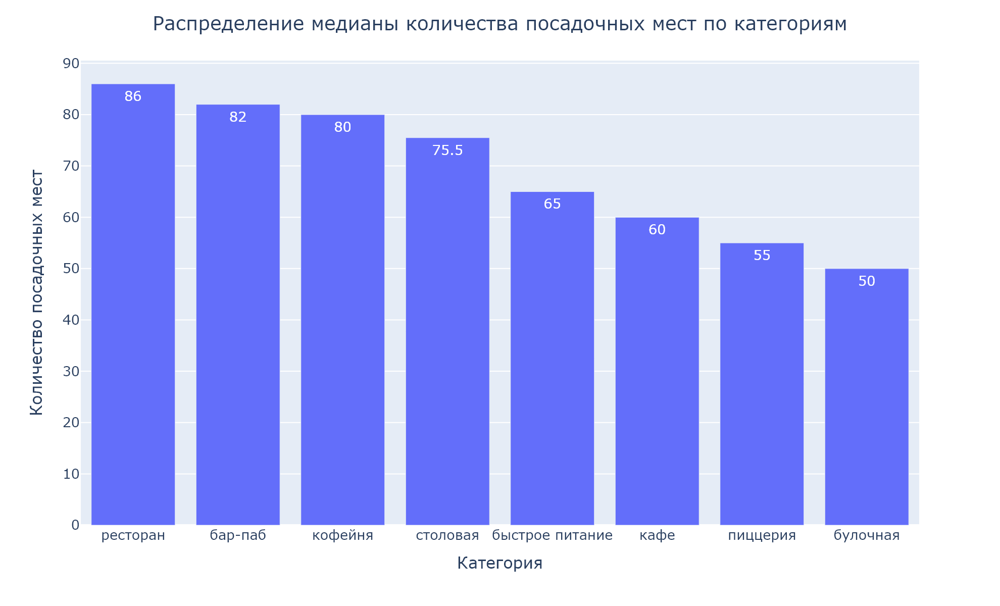

In [70]:
fig = px.bar(sorted_data_pivot_seats,
             x='category',
             y='seats_median',
             text='seats_median')
fig.update_layout(title='Распределение медианы количества посадочных мест по категориям', title_x=0.5,
                  xaxis_title='Категория',
                  yaxis_title='Количество посадочных мест',
                  width=990,
                  height=600,
                  font_size=13.5)
pio.write_image(fig, 'figure.png', width=990, height=600, scale=2)
Image('figure.png')

#### Выводы по иследованию количества посадочных мест заведений

1. Среди 8 представленных категорий больше всех встречаются заведения с 60 посадочными местами (около 950 заведений) и 100 посадочными местами (около 600 заведений). Минимально количество посадочных мест равно 0. Наиболее вероянтно это могут быть заведения с едой на вынос. Среднее количество посадочных мест составляет 108.36. Медианное значение количества посадочных мест составляет 75. Выборка смещена в правую сторону относительно медианы из-за аномально больших значений количества посадочных мест - свыше 280.
2. По медиане количества посадочных мест наибольшее значение имеется в категории рестораны - 86 мест. Далее идут бары-пабы - 82 места, кофейни - 80 мест. В кафе медиана значительно ниже - всего 60 мест. Также распределение посадочных мест в категориях не соответствует распределению категорий заведений по их количеству, представленному в датафрейме.

### Исследование сетевых и не сетевых заведений

#### Напишем функцию categorize_network для разделения на следующие категории:
    если значение chain = 0 - не сетевое заведение;
    если значение chain = 1 - сетевое заведение.

In [71]:
def categorize_network(chain):
    if chain == 0:
        return 'не сетевое заведение'
    elif chain == 1:
        return 'сетевое заведение'

#### Применим функцию categorize_network для добавления столбца network_category и оценим результат добавления в датафрейм

In [72]:
data['network_category'] = data['chain'].apply(categorize_network)
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,network_category
0,Wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False,не сетевое заведение
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False,не сетевое заведение
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False,не сетевое заведение
3,Dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False,не сетевое заведение
4,Иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False,сетевое заведение
5,Sergio pizza,пиццерия,"Москва, Ижорская улица, Вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,Ижорская улица,False,не сетевое заведение
6,Огни города,бар-паб,"Москва, Клязьминская улица, 9, cтр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,Клязьминская улица,False,не сетевое заведение
7,Mr. уголёк,быстрое питание,"Москва, Клязьминская улица, 9, cтр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,Клязьминская улица,False,не сетевое заведение
8,Donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False,не сетевое заведение
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,Ангарская улица,False,не сетевое заведение


#### Построим сводную таблицу методом pivot_table() со следующими столбцами:
    network_category - категория сети заведения
    network_category_count - количество заведений по категории сети
    network_category_count_percent - количество заведений по категории сети в процентах от общего количества

In [73]:
data_pivot_chain = data.pivot_table(index='network_category', values='chain', aggfunc='count').reset_index()
data_pivot_chain.columns = ['network_category', 'network_category_count']
data_pivot_chain['network_category_count_percent'] = round((data_pivot_chain['network_category_count'] /\
                                                            data['chain'].count()) * 100, 2)
data_pivot_chain

,network_category,network_category_count,network_category_count_percent
0,не сетевое заведение,5200,61.88
1,сетевое заведение,3203,38.12


#### Построим круговую диаграмму распределения количества сетевых и не сетевых заведений по данным сводной таблицы data_pivot_chain

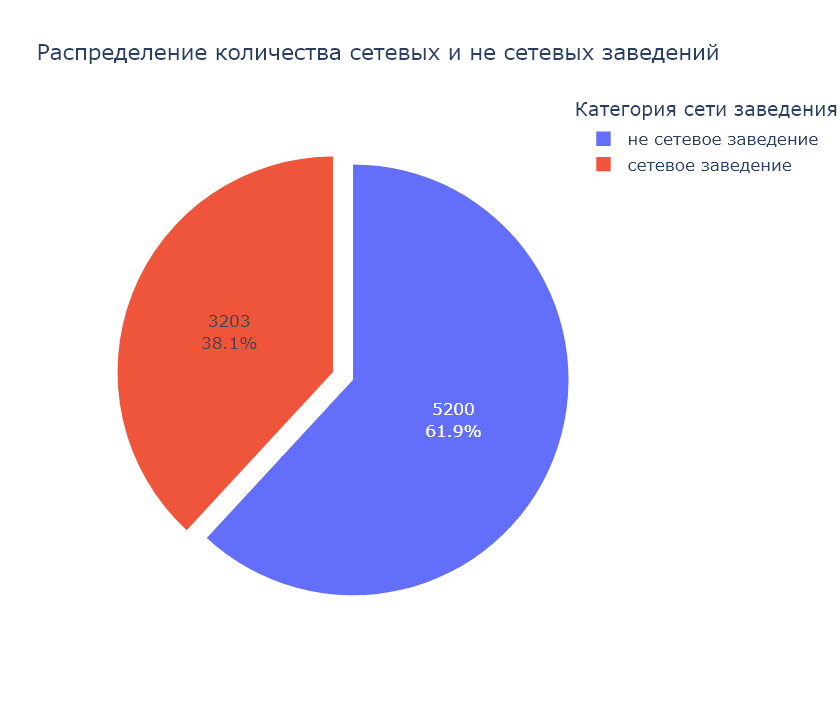

In [74]:
data_pivot_chain['text'] = data_pivot_chain.apply(lambda x: f'{x["network_category_count"]:.0f}', axis=1)
fig = go.Figure(data=[go.Pie(labels=data_pivot_chain['network_category'],
                             values=data_pivot_chain['network_category_count'],
                             text=data_pivot_chain['text'],
                             pull = [0.1, 0])])
fig.update_layout(title='Распределение количества сетевых и не сетевых заведений', width=800, height=600, title_x=0.45,
                  font_size=14, title_font_size=18, legend_font_size=14, annotations=[dict(x=1.57, y=1.05,
                  text='Категория сети заведения', showarrow=False)])
fig.update_annotations(font_size=16)
pio.write_image(fig, 'figure.png', width=700, height=600, scale=1.2)
Image('figure.png')

#### Построим сводную таблицу chain_food следующими столбцами:
    category - категория заведения;
    total_count - количестов заведений по категориям;
    chain_count - количество сетевых заведений в категории;
    chain_percent - доля сетевых завдений в категории в процентах.

In [75]:
chain_food = data.groupby('category').agg({'chain':['count','sum']}).reset_index()
chain_food.columns = ['category','total_count','chain_count']
chain_food['chain_percent'] = round((chain_food['chain_count'] / chain_food['total_count'])*100, 2)
chain_food

,category,total_count,chain_count,chain_percent
0,бар-паб,764,168,21.99
1,булочная,256,157,61.33
2,быстрое питание,603,232,38.47
3,кафе,2377,779,32.77
4,кофейня,1413,720,50.96
5,пиццерия,633,330,52.13
6,ресторан,2042,729,35.70
7,столовая,315,88,27.94


#### Отсортируем таблицу chain_food по доле сетевых завдений в категории

In [76]:
sorted_chain_food = chain_food.sort_values(by='chain_percent', ascending=False).reset_index(drop=True)
sorted_chain_food

,category,total_count,chain_count,chain_percent
0,булочная,256,157,61.33
1,пиццерия,633,330,52.13
2,кофейня,1413,720,50.96
3,быстрое питание,603,232,38.47
4,ресторан,2042,729,35.70
5,кафе,2377,779,32.77
6,столовая,315,88,27.94
7,бар-паб,764,168,21.99


#### Применим градентную заливку столбцо chain_count, total_count, chain_percent таблицы sorted_chain_food

In [77]:
display(sorted_chain_food.style.background_gradient(subset=['chain_count', 'total_count','chain_percent'],cmap=\
                                                    'Blues', axis=0))
order = list(sorted_chain_food['category'])

,category,total_count,chain_count,chain_percent
0,булочная,256,157,61.330000
1,пиццерия,633,330,52.130000
2,кофейня,1413,720,50.960000
3,быстрое питание,603,232,38.470000
4,ресторан,2042,729,35.700000
5,кафе,2377,779,32.770000
6,столовая,315,88,27.940000
7,бар-паб,764,168,21.990000


#### Построим столбчатую диаграмму распределения доли сетевых заведений по категориям по данным сводных таблицы sorted_chain_food

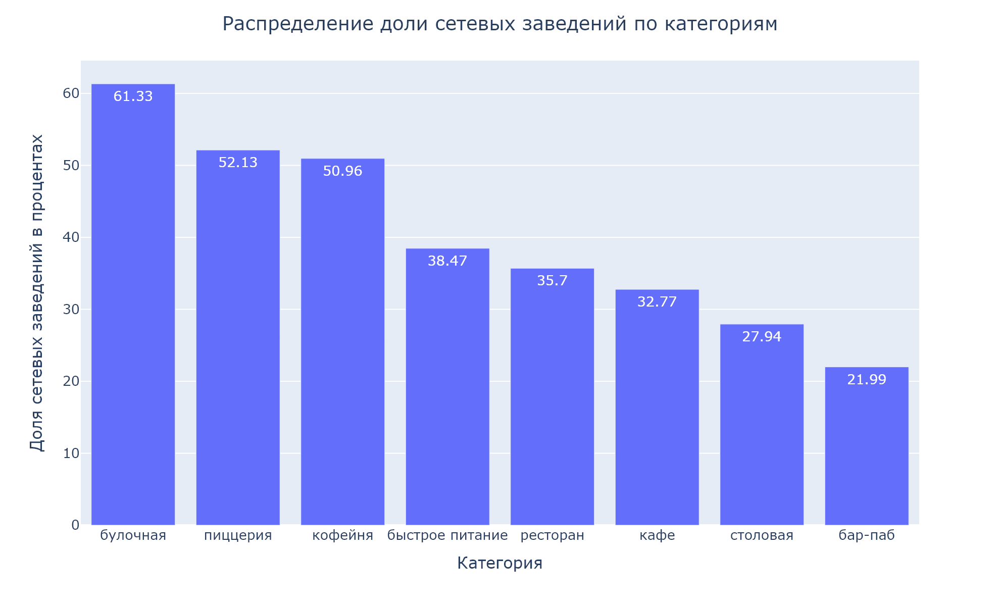

In [78]:
fig = px.bar(sorted_chain_food,
             x='category',
             y='chain_percent',
             text='chain_percent')
fig.update_layout(title='Распределение доли сетевых заведений по категориям', title_x=0.5,
                  xaxis_title='Категория',
                  yaxis_title='Доля сетевых заведений в процентах',
                  width=990,
                  height=600,
                  font_size=13.5)
pio.write_image(fig, 'figure.png', width=990, height=600, scale=2)
Image('figure.png')

#### Выводу по исследованию сетевых и не сетевых заведений

В датафрейме больше представлено не сетевых заведений - 5200 заведение или 61,9% от общего количества. Наибольшая доля сетевых заведений представлена в булочных (61.33%), пиццериях (52.13%), кофейнях (50.96%). Таким образом, для заведений типа булочные, пиццерии и кофейни более характерно сетевое распределение.

### Исследование топовых сетей общественного питания в Москве

#### Создадим отфильтрованный датафрейм filtered_data_chain, в котором будут только сетевые заведения

In [79]:
filtered_data_chain = data.query('chain == 1')

#### Создадим сводную таблицу методом groupby() со следующими столбцами:
    name - название заведения;
    category - категория заведения;
    name_count - количество заведения по названию и категории.

In [80]:
summary_table = filtered_data_chain.groupby(['name', 'category']).size().reset_index(name='name_count')
summary_table

,name,category,name_count
0,1-я креветочная,кафе,1
1,10 идеальных пицц,ресторан,3
2,18 грамм,кофейня,3
3,4 сезона,кафе,1
4,7 сэндвичей,кофейня,4
...,...,...,...
1144,Ян примус,ресторан,2
1145,Яндекс лавка,ресторан,69
1146,Яндекс.лавка,ресторан,3
1147,Японская кухня,кафе,2


#### Отсортируем сводную таблицу summary_table по количеству заведений по столбцу name_count по убыванию, переименуем столбец category в Категория и выведем первые 15 значений

In [81]:
sorted_summary_table = summary_table.sort_values(by='name_count', ascending=False).reset_index(drop=True)
sorted_summary_table_top = sorted_summary_table.head(15)
sorted_summary_table_top

,name,category,name_count
0,Шоколадница,кофейня,119
1,Домино'с пицца,пиццерия,76
2,Додо пицца,пиццерия,74
3,One price coffee,кофейня,71
4,Яндекс лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,49
7,Кофепорт,кофейня,42
8,Кулинарная лавка братьев караваевых,кафе,39
9,Теремок,ресторан,36


#### Построим столбчатую диаграмму распередения топ 15 сетевых заведений по количеству по данным сводной таблицы sorted_summary_table_top

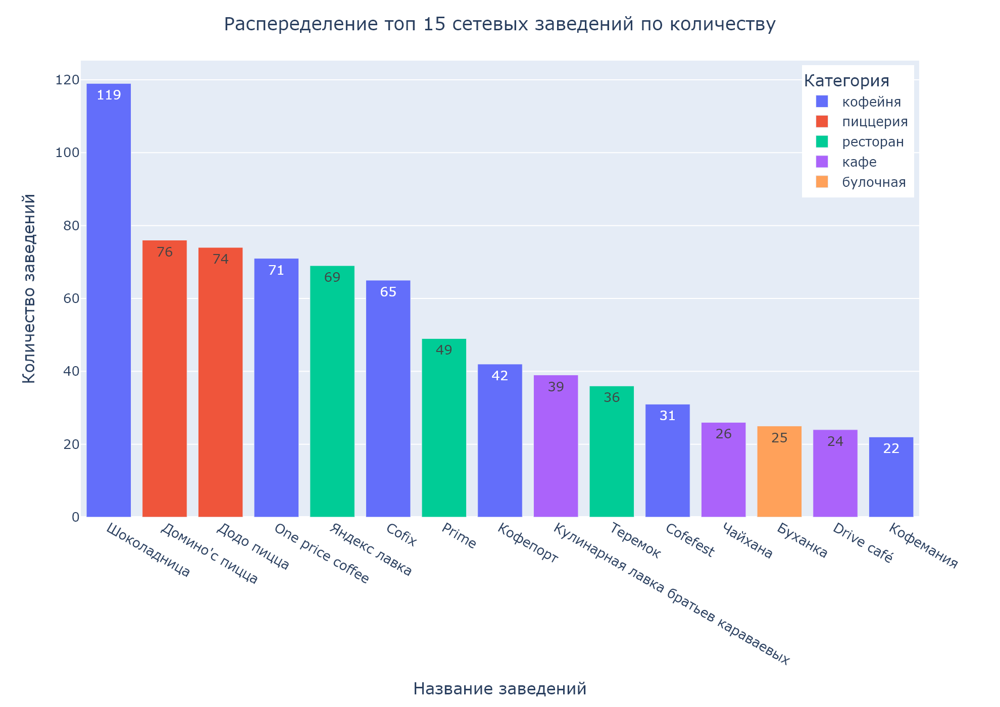

In [82]:
fig = px.bar(sorted_summary_table_top.sort_values(by='name_count', ascending=False),
             x='name',
             y='name_count',
             color='category',
             text='name_count',
             category_orders={"name": sorted_summary_table_top.sort_values(by='name_count', ascending=False)['name']})
fig.update_layout(title='Распеределение топ 15 сетевых заведений по количеству', title_x=0.5,
                  xaxis_title='Название заведений',
                  yaxis_title='Количество заведений',
                  width=990,
                  height=700,
                  font_size=13,
                  legend=dict(x=0.86, y=0.99),
                  legend_title='Категория')
pio.write_image(fig, 'figure.png', width=990, height=700, scale=2)
Image('figure.png')

#### Создадим сводную таблицу по количеству категорий заведений в топ 15 сетей

In [83]:
top_categories = sorted_summary_table_top.groupby('category').size().reset_index(name='category_count')
soted_top_categories = top_categories.sort_values(by='category_count', ascending=False).reset_index(drop=True)
soted_top_categories

,category,category_count
0,кофейня,6
1,кафе,3
2,ресторан,3
3,пиццерия,2
4,булочная,1


#### Построим столбчатую диаграмму распределения категорий заведений в топ-15 сетях

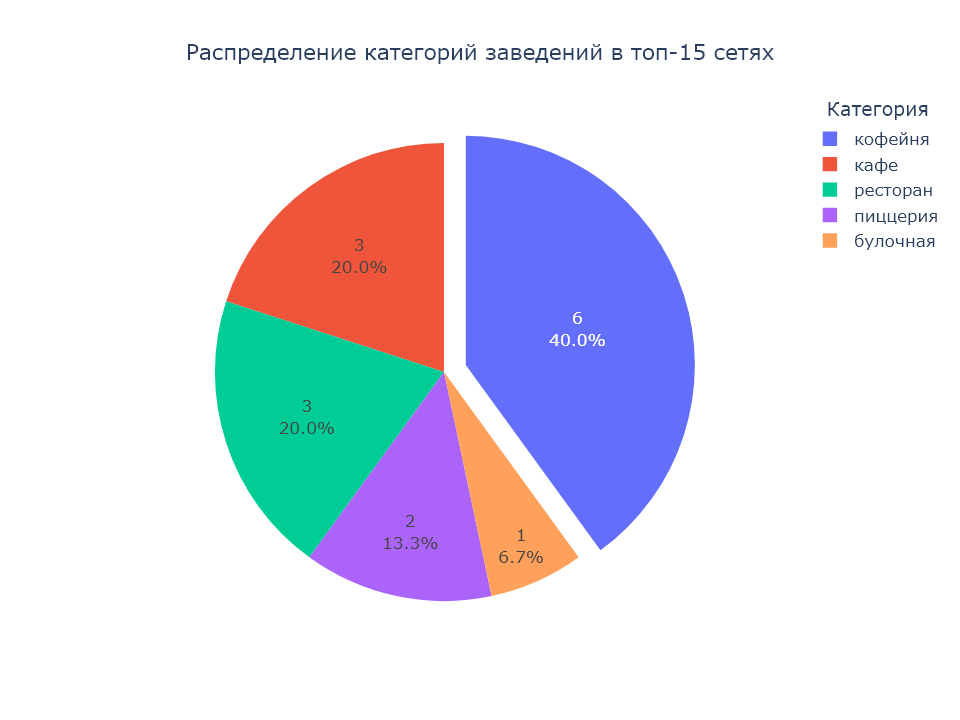

In [84]:
soted_top_categories['text'] = soted_top_categories.apply(lambda x: f'{x["category_count"]:.0f}', axis=1)
fig = go.Figure(data=[go.Pie(labels=soted_top_categories['category'],
                             values=soted_top_categories['category_count'],
                             text=soted_top_categories['text'],
                             pull = [0.1, 0])])
fig.update_layout(title='Распределение категорий заведений в топ-15 сетях', width=800, height=600, title_x=0.5,
                  font_size=14, title_font_size=18, legend_font_size=14, annotations=[dict(x=1.2, y=1.05,
                  text='Категория', showarrow=False)])
fig.update_annotations(font_size=16)
fig.update_traces(texttemplate='%{text}<br>%{percent:.1%}', textinfo='text+percent')
pio.write_image(fig, 'figure.png', width=800, height=600, scale=1.2)
Image('figure.png')

#### Построим сводную таблицу методом pivot_table() со следующими столбцами:
    category - категория заведения
    name_count - количество заведений по категориям
    name_count_percent - количество заведений по категориям в процентах от общего количества

In [85]:
data_pivot_count_top = sorted_summary_table_top.pivot_table(index='category', values='name_count', \
                                                            aggfunc='sum').reset_index()
data_pivot_count_top.columns = ['category', 'name_count']
data_pivot_count_top['name_count_percent'] = round((data_pivot_count_top['name_count'] /\
                                                    data_pivot_count_top['name_count'].sum()) * 100, 2)
data_pivot_count_top

,category,name_count,name_count_percent
0,булочная,25,3.26
1,кафе,89,11.59
2,кофейня,350,45.57
3,пиццерия,150,19.53
4,ресторан,154,20.05


#### Отсортируем сводную таблицу sorted_data_pivot_count_top по убывани по количеству заведений

In [86]:
sorted_data_pivot_count_top = data_pivot_count_top.sort_values(by='name_count', ascending=False).reset_index(drop=True)
sorted_data_pivot_count_top

,category,name_count,name_count_percent
0,кофейня,350,45.57
1,ресторан,154,20.05
2,пиццерия,150,19.53
3,кафе,89,11.59
4,булочная,25,3.26


#### Построим круговую диаграмму распределения количества заведений по категориям в топ-15 сетях по данным сводной таблицы sorted_data_pivot_count_top

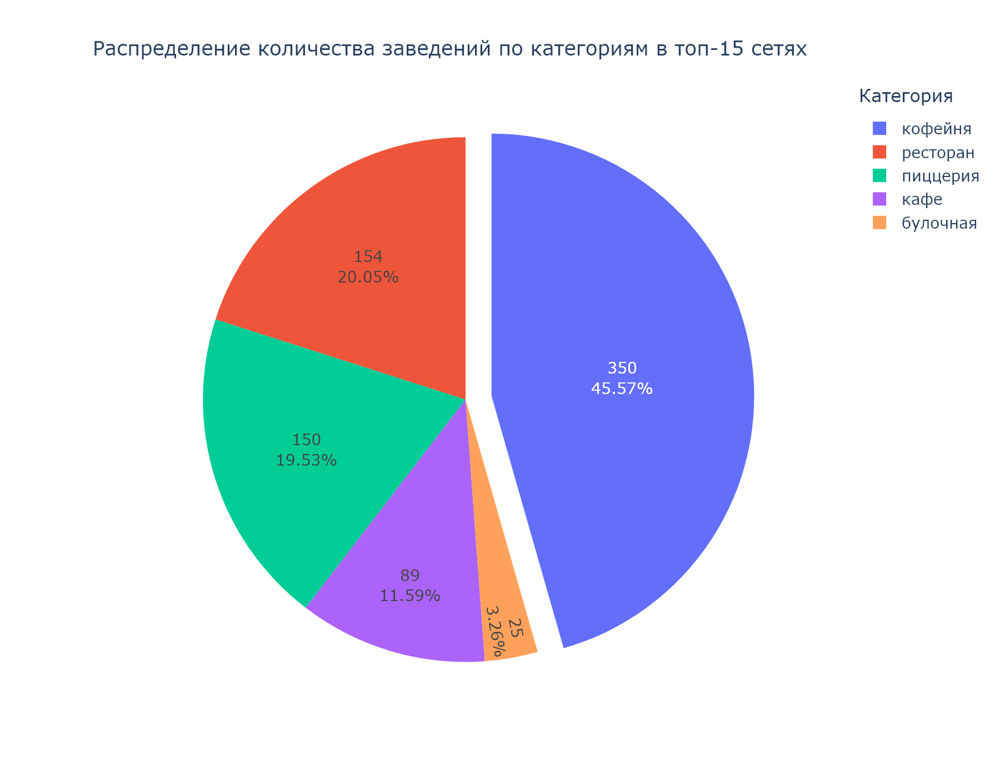

In [87]:
sorted_data_pivot_count_top['text'] = sorted_data_pivot_count_top.apply(lambda x: f'{x["name_count"]:.0f}', axis=1)
fig = go.Figure(data=[go.Pie(labels=sorted_data_pivot_count_top['category'],
                             values=sorted_data_pivot_count_top['name_count'],
                             text=sorted_data_pivot_count_top['text'],
                             pull = [0.1, 0])])
fig.update_layout(title='Распределение количества заведений по категориям в топ-15 сетях', width=900, height=700, \
                  title_x=0.45,
                  font_size=14, title_font_size=18, legend_font_size=14, annotations=[dict(x=1.15, y=1.05,
                  text='Категория', showarrow=False)])
fig.update_annotations(font_size=16)
fig.update_traces(texttemplate='%{text}<br>%{percent:.2%}', textinfo='text+percent', textposition='inside')
pio.write_image(fig, 'figure.png', width=900, height=700, scale=2)
Image('figure.png')

#### Выводы по исследованию топовых сетей общественного питания в Москве

Среди топ 15 сетевых заведений по количеству в Москве самая крупная сеть - это кофейни Шоколадница, которая имеет 119 точек. 6 из 15 топ сетей этой кофейни, что составляет 40%. Следующие крупные категории это кафе и рестораны - по 3 сети или 20%. Среди топ 15 сетей на долю кофейн приходится 350 заведений или 45.57%. Далее идут рестораны (154 заведения или 20.05%), пиццерии (150 заведений или 19.53%), кафе (89 заведений или 11.59%) и булочные(25 заведений или 3.26%).

### Исследование заведений по административным районам Москвы

#### Построим сводную таблицу data_pivot_district методом pivot_table() со следующими столбцами:
    district - административный район, в котором находится заведение
    category - категория заведения
    count_public_food - количество заведений по административным районам и категориям

In [88]:
data_pivot_district = data.pivot_table(index=['district', 'category'], values='name', aggfunc='count').reset_index()
data_pivot_district.columns = ['district', 'category', 'count_public_food']
data_pivot_district.head(16)

,district,category,count_public_food
0,Восточный административный округ,бар-паб,53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105
5,Восточный административный округ,пиццерия,72
6,Восточный административный округ,ресторан,160
7,Восточный административный округ,столовая,40
8,Западный административный округ,бар-паб,50
9,Западный административный округ,булочная,37


#### Построим сводную таблицу district_sum методом pivot_table() со следующими столбцами:
    district - административный район, в котором находится заведение
    total_count_public_food - количество заведений по административным районам

In [89]:
district_sum = data_pivot_district.groupby('district')['count_public_food'].sum().reset_index()
district_sum.columns = ['district', 'total_count_public_food']
district_sum

,district,total_count_public_food
0,Восточный административный округ,798
1,Западный административный округ,850
2,Северный административный округ,899
3,Северо-Восточный административный округ,890
4,Северо-Западный административный округ,409
5,Центральный административный округ,2242
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Южный административный округ,892


#### Объединим сводные таблицы data_pivot_district и district_sum по столбцу district и оценим результат объединения

In [90]:
data_pivot_district = data_pivot_district.merge(district_sum, on='district')
data_pivot_district

,district,category,count_public_food,total_count_public_food
0,Восточный административный округ,бар-паб,53,798
1,Восточный административный округ,булочная,25,798
2,Восточный административный округ,быстрое питание,71,798
3,Восточный административный округ,кафе,272,798
4,Восточный административный округ,кофейня,105,798
...,...,...,...,...
67,Южный административный округ,кафе,264,892
68,Южный административный округ,кофейня,131,892
69,Южный административный округ,пиццерия,73,892
70,Южный административный округ,ресторан,202,892


#### Отсортируем сводную таблицу data_pivot_district по столбцам total_count_public_food и count_public_food по убыванию, а также добавим столбец count_public_food_percent - доля каждой категории заведения в административном районе в процентах

In [91]:
sorded_data_pivot_district = data_pivot_district.sort_values(by=['total_count_public_food', 'count_public_food'],\
                                                             ascending=False).reset_index(drop=True)
sorded_data_pivot_district['count_public_food_percent'] = round((sorded_data_pivot_district['count_public_food'] /\
                                                           sorded_data_pivot_district['total_count_public_food'])*100, 2)
sorded_data_pivot_district.head(16)

,district,category,count_public_food,total_count_public_food,count_public_food_percent
0,Центральный административный округ,ресторан,670,2242,29.88
1,Центральный административный округ,кафе,464,2242,20.70
2,Центральный административный округ,кофейня,428,2242,19.09
3,Центральный административный округ,бар-паб,364,2242,16.24
4,Центральный административный округ,пиццерия,113,2242,5.04
5,Центральный административный округ,быстрое питание,87,2242,3.88
6,Центральный административный округ,столовая,66,2242,2.94
7,Центральный административный округ,булочная,50,2242,2.23
8,Северный административный округ,кафе,235,899,26.14
9,Северный административный округ,кофейня,193,899,21.47


#### Построим столбчатую диаграмму распределение количества заведений по районам и категориям по данным таблицы sorded_data_pivot_district

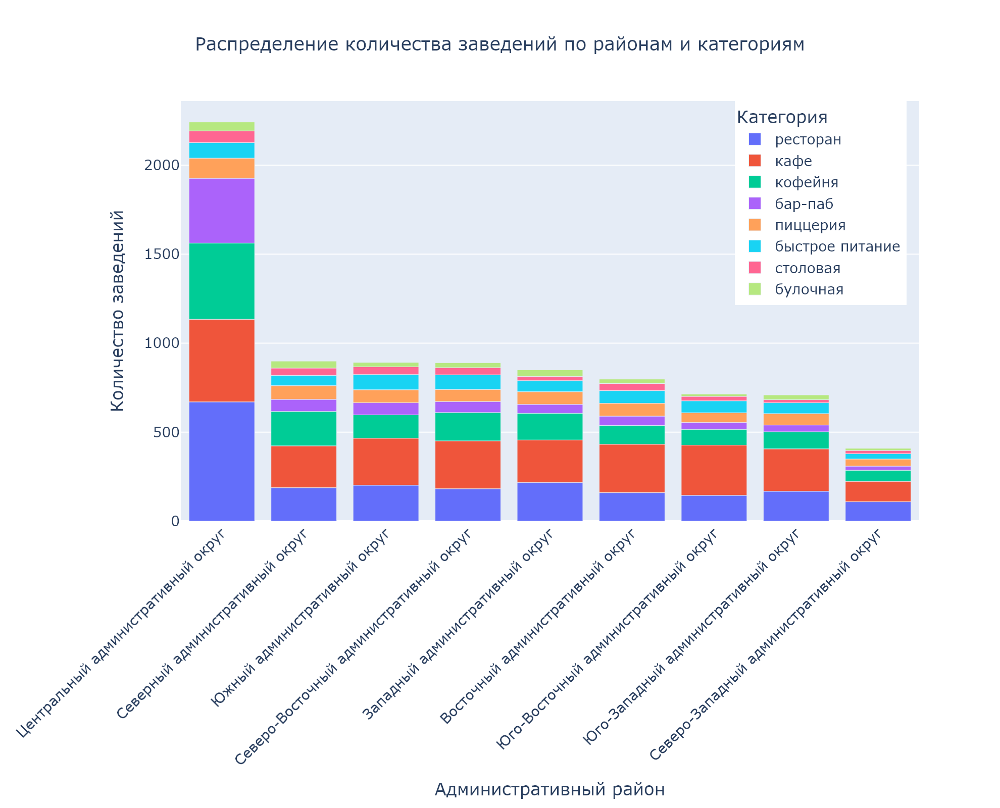

In [92]:
fig = px.bar(sorded_data_pivot_district, x='district', y='count_public_food', color='category',
             title='Распределение количества заведений по районам и категориям')
fig.update_layout(title_x=0.5,
                  width=990, height=800,
                  font_size=14,
                  legend_font_size=14,
                  title_font_size=18,
                  legend=dict(x=0.75, y=1.0),
                  legend_title='Категория',
                  xaxis_title='Административный район',
                  yaxis_title='Количество заведений')
fig.update_xaxes(tickangle=-45)
pio.write_image(fig, 'figure.png', width=990, height=800, scale=2)
Image('figure.png')

#### Построим нормированную столбчатую диаграмму распределение количества заведений по районам и категориям в процентах по данным таблицы sorded_data_pivot_district

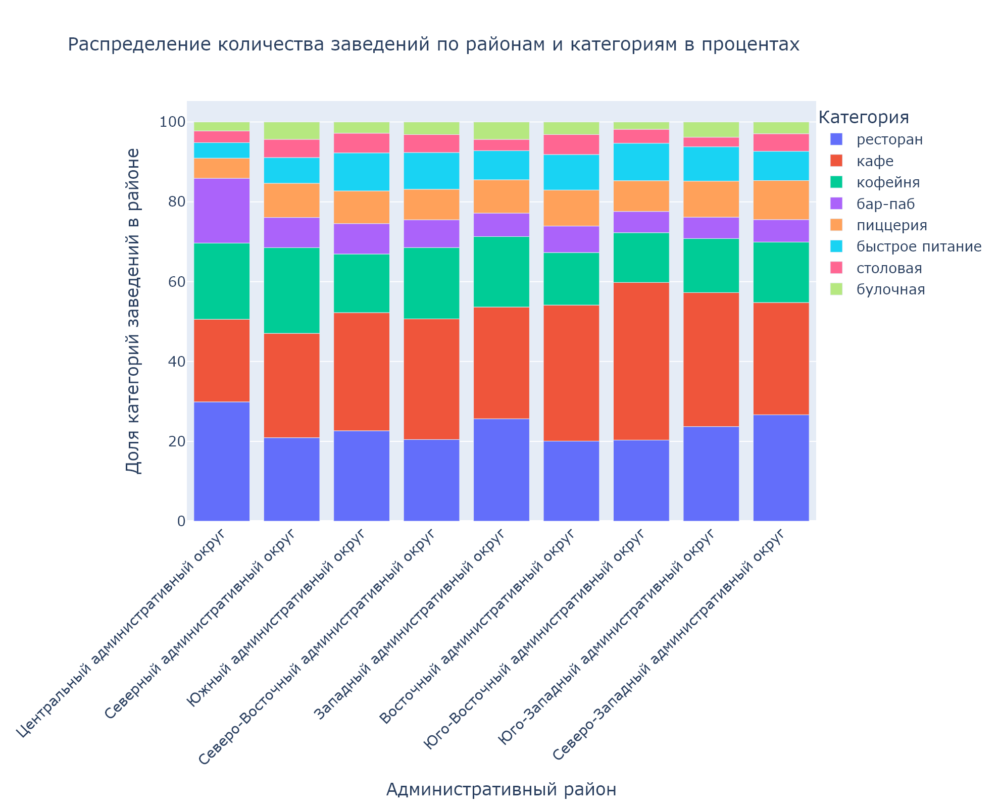

In [93]:
fig = px.bar(sorded_data_pivot_district, x='district', y='count_public_food', color='category',
             title='Распределение количества заведений по районам и категориям в процентах')
fig.update_layout(title_x=0.8,
                  width=990, height=800,
                  font_size=14,
                  legend_font_size=14,
                  title_font_size=18,
                  legend=dict(x=1, y=1.0),
                  legend_title='Категория',
                  xaxis_title='Административный район',
                  yaxis_title='Доля категорий заведений в районе',
                  barnorm='percent')
fig.update_xaxes(tickangle=-45)
pio.write_image(fig, 'figure.png', width=990, height=800, scale=2)
Image('figure.png')

#### Отсортируем сводную таблицу district_sum по столбцу total_count_public_food по убыванию и добавим столбец total_count_public_food_percent для отображения количества заведений по административным районам в процентах

In [94]:
sorted_district_sum = district_sum.sort_values(by='total_count_public_food', ascending=False).reset_index(drop=True)
sorted_district_sum['total_count_public_food_percent'] = round((sorted_district_sum['total_count_public_food'] /\
                                                         sorted_district_sum['total_count_public_food'].sum())*100, 2)
sorted_district_sum

,district,total_count_public_food,total_count_public_food_percent
0,Центральный административный округ,2242,26.68
1,Северный административный округ,899,10.70
2,Южный административный округ,892,10.62
3,Северо-Восточный административный округ,890,10.59
4,Западный административный округ,850,10.12
5,Восточный административный округ,798,9.50
6,Юго-Восточный административный округ,714,8.50
7,Юго-Западный административный округ,709,8.44
8,Северо-Западный административный округ,409,4.87


#### Создадим отфильтрованый датафрейм из таблицы sorded_data_pivot_district, где будут присутстовать категории заведений - ресторан, кафе, кофейня и отсортируем получившийся датафрейм по категориям и доле заведений в административном районе

In [95]:
sorded_data_pivot_district_2 = sorded_data_pivot_district.query('category == ["ресторан", "кафе", "кофейня"]')
sorded_data_pivot_district_2.sort_values(by=['category', 'count_public_food_percent'], ascending=\
                                         False).reset_index(drop=True)

,district,category,count_public_food,total_count_public_food,count_public_food_percent
0,Центральный административный округ,ресторан,670,2242,29.88
1,Северо-Западный административный округ,ресторан,109,409,26.65
2,Западный административный округ,ресторан,218,850,25.65
3,Юго-Западный административный округ,ресторан,168,709,23.70
4,Южный административный округ,ресторан,202,892,22.65
5,Северный административный округ,ресторан,188,899,20.91
6,Северо-Восточный административный округ,ресторан,182,890,20.45
7,Юго-Восточный административный округ,ресторан,145,714,20.31
8,Восточный административный округ,ресторан,160,798,20.05
9,Северный административный округ,кофейня,193,899,21.47


#### Выводы по исследованию заведений в административных районам Москвы

В датафрейме представлено 9 административных районов Москвы. Среди всех районов большее количество заведений представлено в центральном административном округе - 2242 заведения или 26.68%. Меньше всех заведений представлено в северо-западном административном округе - 409 заведений или 4.87%. Количественное распределение заведений по категориям в каждом районе разное. Например лидерам по количеству заведений в центральной административном округе являются рестораны, кафе и кофейни (670, 464, 428 заведений соответственно). При этом напрмер в северном административном округе это уже кафе, кофейни и рестораны (235, 193, 189 заведений соответственно). Наибольшая доля ресторанов присутствует в юго-восточном административном округе - 29.88%, наименьшая в восточном административном округе - 20.05%. Наибольшая доля кафе представлена в юго-восточном административный округе - 39.50%, наименьшая в центральном административном округе - 20.70%. Наибольшая доля кофеин представлена в северном административном округе - 21.47%, наименьшая в юго-восточном административном округе 12.46%.

###  Исследование средних рейтингов по категориям заведений

#### Оценим общие числовые характеристика рейтинга заведений по столбцу rating

In [96]:
data['rating'].describe()

count    8403.000000
mean        4.229894
std         0.470426
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

#### Построим сводную таблицу data_pivot_rating методом pivot_table() со следующими столбцами:
    category - категория заведения
    rating_mean - средний рейтинг заведений по категориям

In [97]:
data_pivot_rating = data.pivot_table(index='category', values='rating', aggfunc='mean').reset_index()
data_pivot_rating.columns = ['category', 'rating_mean']
data_pivot_rating['rating_mean'] = round(data_pivot_rating['rating_mean'], 2)
data_pivot_rating

,category,rating_mean
0,бар-паб,4.39
1,булочная,4.27
2,быстрое питание,4.05
3,кафе,4.12
4,кофейня,4.28
5,пиццерия,4.30
6,ресторан,4.29
7,столовая,4.21


#### Отсортируем сводную таблицу data_pivot_rating по среднему рейтингу по убыванию

In [98]:
sorted_data_pivot_rating = data_pivot_rating.sort_values(by='rating_mean', ascending=False).reset_index(drop=True)
sorted_data_pivot_rating

,category,rating_mean
0,бар-паб,4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


#### Построим столбчатую диаграмму распределения средних рейтингов по категориям заведений по данным таблицы sorted_data_pivot_rating

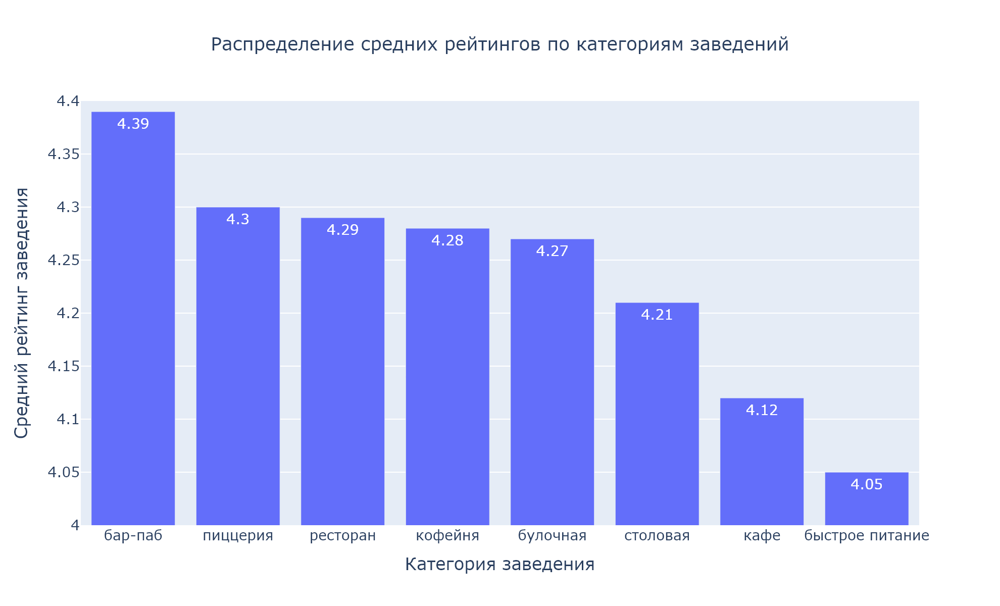

In [99]:
fig = px.bar(sorted_data_pivot_rating, x='category', y='rating_mean',
             title='Распределение средних рейтингов по категориям заведений',
             text = 'rating_mean')
fig.update_layout(title_x=0.5,
                  width=990, height=600,
                  font_size=14,
                  title_font_size=18,
                  xaxis_title='Категория заведения',
                  yaxis_title='Средний рейтинг заведения')
fig.update_yaxes(range=[4, 4.4])
pio.write_image(fig, 'figure.png', width=990, height=600, scale=2)
Image('figure.png')

#### Оценим разницу между самым высоким и самым низким рейтингом в категориях заведений в абсолютных значениях и в процентах

In [100]:
difference_categories_rating = round((sorted_data_pivot_rating.iloc[0, 1] - sorted_data_pivot_rating.iloc[7, 1]), 2)
difference_categories_rating_percent = round(((sorted_data_pivot_rating.iloc[0, 1] - \
                                            sorted_data_pivot_rating.iloc[7, 1]) / \
                                              sorted_data_pivot_rating.iloc[0, 1])*100, 2)
display(difference_categories_rating)                                     
display(difference_categories_rating_percent)

0.34

7.74

#### Выводы по иследованию средних рейтингов по категориям заведений

Медианный рейтинг заведений составляет 4.3. Самый высокий средний рейтинг заведений у баров-пабов 4.39. Самый низкий рейтинг заведений у заведений быстрого питания - 4.05. Разница между максимальным и минимальнмым рейтингом незначительная и составляет всего 0.34 или 7.74%.

### Построение фоновой картограммы со средним рейтингом для каждого административного района

#### Построим сводную таблицу pivot_rating_district методом pivot_table() со следующими столбцами:
    district - административный район заведения
    rating_mean - средний рейтинг заведений по административному району

In [101]:
pivot_rating_district = data.pivot_table(index='district', values='rating', aggfunc='mean').reset_index()
pivot_rating_district.columns = ['district', 'rating_mean']
pivot_rating_district['rating_mean'] = round(pivot_rating_district['rating_mean'], 2)
pivot_rating_district

,district,rating_mean
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


#### Остортируем сводную таблицу pivot_rating_district по среднему рейтингу по убыванию

In [102]:
sorted_pivot_rating_district = pivot_rating_district.sort_values(by='rating_mean', ascending=False).reset_index(drop=True)
sorted_pivot_rating_district

,district,rating_mean
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Западный административный округ,4.18
4,Южный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


#### Построим фоновую картограмму со средним рейтингом заведений каждого района

##### Загружаем JSON-файл с границами округов Москвы и открываем файл в режиме чтения с кодировкой UTF-8 с последующей загрузкой данных из файла

In [103]:
state_geo = r'C:\Users\Равиль\Проекты для портфолио\1. Проект по общепиту\admin_level_geomap.geojson'
with open(state_geo, 'r', encoding='utf-8') as f:
     state_geo_data = json.load(f)

##### Определяем широту и долготу центра Москвы и создаем ее карту

In [104]:
moscow_lat, moscow_lng = 55.751244, 37.618423
map_avg_rating = Map(location=[moscow_lat, moscow_lng], zoom_start=9.5, tiles='Cartodb Positron')

##### Cоздаём хороплет с помощью конструктора Choropleth, добавляем его на карту и выводим карту на экран

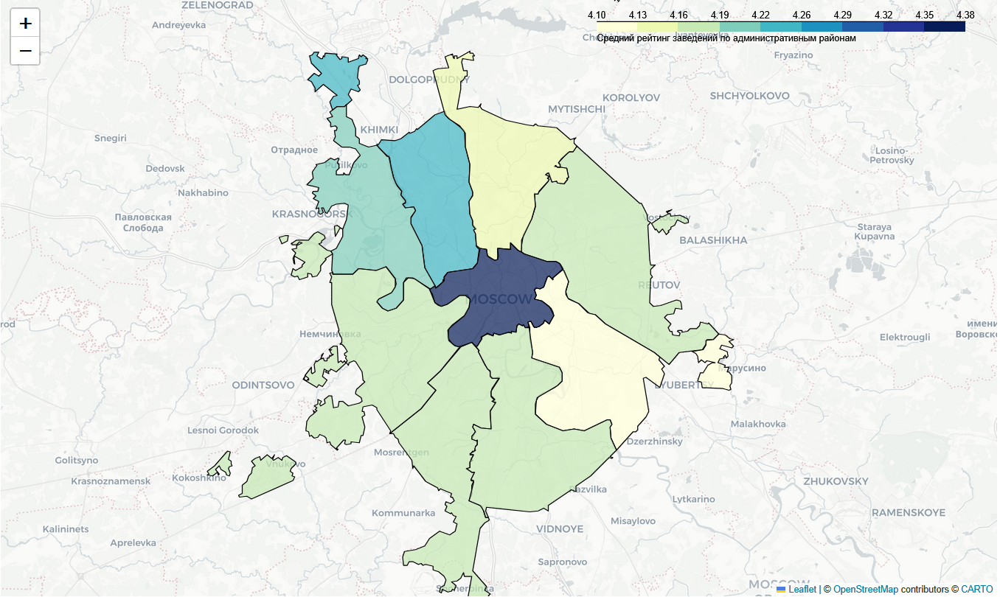

In [105]:
Choropleth(
    geo_data=state_geo_data,
    data=sorted_pivot_rating_district,
    columns=['district', 'rating_mean'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    legend_name='Средний рейтинг заведений по административным районам',
    bins=9
).add_to(map_avg_rating)
# Для отображения карты в GitHub подгружаем ее в виде рисунка из локального места на ПК
Image(filename=r'C:\Users\Равиль\Проекты для портфолио\1. Проект по общепиту\map_avg_rating.png', width=1000, height=600)

#### Выводы по фоновой картограмме

Самый высокий рейтинг у заведений в центральном административном округе 4.38. Самый низкий рейтинг в юговосточном административном округе 4.10. В большинстве остальных округов рейтинг находится в пределах от 4.15 до 4.19.

### Отображение всех заведений на карте с помощью кластеров

#### Создадим функцию create_clusters которая принимает строку датафрейма, создаёт маркер в текущей точке и добавляет его в кластер marker_cluster

In [106]:
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

#### Создадим карту Москвы, пустой кластер marker_cluster, применим функцию create_clusters() к каждой строке датафрейма и выведем карту на экран

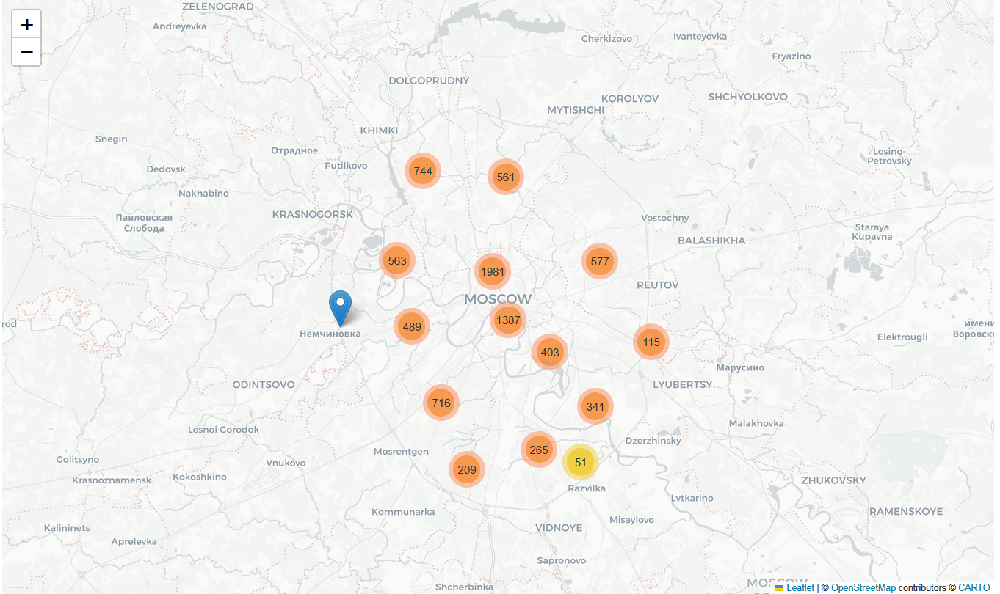

In [107]:
map_all_food = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
marker_cluster = MarkerCluster().add_to(map_all_food)
data.apply(create_clusters, axis=1)
# Для отображения карты в GitHub подгружаем ее в виде рисунка из локального места на ПК
Image(filename=r'C:\Users\Равиль\Проекты для портфолио\1. Проект по общепиту\map_all_food.png', width=1000, height=600)

#### Выводы по отображаению всех заведений на карте с помощью кластеров

Наибольшая плотность заведений расположена центре Москвы. При удалении от центра плотность заведений снижается.

### Исследование топ-15 улиц по количеству заведений

#### Построим сводную таблицу data_pivot_street методом pivot_table() со следующими столбцами:
    street - улица, где находится заведение
    category - категория заведения
    street_count - количество заведений по категориям и улицам

In [108]:
data_pivot_street = data.pivot_table(index=['street', 'category'], values='name', aggfunc='count').reset_index()
data_pivot_street.columns = ['street', 'category', 'street_count']
data_pivot_street

,street,category,street_count
0,1-Й cтрелецкий проезд,кафе,1
1,1-Й cтрелецкий проезд,кофейня,1
2,1-Й Автозаводский проезд,кафе,1
3,1-Й Балтийский переулок,ресторан,1
4,1-Й Варшавский проезд,кафе,1
...,...,...,...
3816,шоссейная улица,кофейня,1
3817,шоссейная улица,пиццерия,1
3818,шоссейная улица,ресторан,3
3819,шоссейный проезд,бар-паб,1


#### Построим сводную таблицу street_sum методом pivot_table() со следующими столбцами:
    street - улица, где находится заведение
    total_street_count - количество заведений по улицам

In [109]:
street_sum = data_pivot_street.groupby('street')['street_count'].sum().reset_index()
street_sum.columns = ['street', 'total_street_count']
street_sum

,street,total_street_count
0,1-Й cтрелецкий проезд,2
1,1-Й Автозаводский проезд,1
2,1-Й Балтийский переулок,1
3,1-Й Варшавский проезд,1
4,1-Й Вешняковский проезд,1
...,...,...
1442,улица нижняя Масловка,5
1443,шоссе Энтузиастов,33
1444,шоссейная улица,12
1445,шоссейный проезд,1


#### Отсортируем сводную таблицу street_sum по столбцу total_street_count по убыванию и оставим в ней только первые 15 значений

In [110]:
sorted_street_sum = street_sum.sort_values(by='total_street_count', ascending=False).reset_index(drop=True)
sorted_street_sum.head(15)

,street,total_street_count
0,проспект Мира,183
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


#### Объединим сводные таблицы data_pivot_street и street_sum по столбцу district и оценим результат объединения

In [111]:
data_pivot_street_all = data_pivot_street.merge(street_sum, on='street')
data_pivot_street_all

,street,category,street_count,total_street_count
0,1-Й cтрелецкий проезд,кафе,1,2
1,1-Й cтрелецкий проезд,кофейня,1,2
2,1-Й Автозаводский проезд,кафе,1,1
3,1-Й Балтийский переулок,ресторан,1,1
4,1-Й Варшавский проезд,кафе,1,1
...,...,...,...,...
3816,шоссейная улица,кофейня,1,12
3817,шоссейная улица,пиццерия,1,12
3818,шоссейная улица,ресторан,3,12
3819,шоссейный проезд,бар-паб,1,1


#### Отсортируем сводную таблицу data_pivot_street_all по столбцам total_street_count и street_count по убыванию, а также добавим столбец total_street_count_percent - доля каждой категории заведения в улице в процентах

In [112]:
sorded_data_pivot_street_all = data_pivot_street_all.sort_values(by=['total_street_count', 'street_count'],\
                                                             ascending=False).reset_index(drop=True)
sorded_data_pivot_street_all['total_street_count_percent'] = round((sorded_data_pivot_street_all['street_count'] /\
                                                           sorded_data_pivot_street_all['total_street_count'])*100, 2)
sorded_data_pivot_street_all

,street,category,street_count,total_street_count,total_street_count_percent
0,проспект Мира,кафе,53,183,28.96
1,проспект Мира,ресторан,45,183,24.59
2,проспект Мира,кофейня,36,183,19.67
3,проспект Мира,быстрое питание,21,183,11.48
4,проспект Мира,бар-паб,11,183,6.01
...,...,...,...,...,...
3816,улица Шухова,ресторан,1,1,100.00
3817,улица Юннатов,столовая,1,1,100.00
3818,улица большая Молчановка,кафе,1,1,100.00
3819,шоссейный проезд,бар-паб,1,1,100.00


#### Оценим какие индексы есть у строк, где содержится последняя из улиц, входящая в топ 15 по количеству заведений

In [113]:
sorded_data_pivot_street_all.query('street == "Пятницкая улица"')

,street,category,street_count,total_street_count,total_street_count_percent
104,Пятницкая улица,ресторан,18,48,37.50
105,Пятницкая улица,бар-паб,9,48,18.75
106,Пятницкая улица,кафе,7,48,14.58
107,Пятницкая улица,кофейня,6,48,12.50
108,Пятницкая улица,булочная,3,48,6.25
109,Пятницкая улица,пиццерия,3,48,6.25
110,Пятницкая улица,быстрое питание,2,48,4.17


#### Отфильтруем таблицу sorded_data_pivot_street_all, отставив в ней только первые 111 значений

In [114]:
sorded_data_pivot_street_all_top = sorded_data_pivot_street_all.head(111)
sorded_data_pivot_street_all_top.head(10)

,street,category,street_count,total_street_count,total_street_count_percent
0,проспект Мира,кафе,53,183,28.96
1,проспект Мира,ресторан,45,183,24.59
2,проспект Мира,кофейня,36,183,19.67
3,проспект Мира,быстрое питание,21,183,11.48
4,проспект Мира,бар-паб,11,183,6.01
5,проспект Мира,пиццерия,11,183,6.01
6,проспект Мира,булочная,4,183,2.19
7,проспект Мира,столовая,2,183,1.09
8,Профсоюзная улица,кафе,35,122,28.69
9,Профсоюзная улица,ресторан,26,122,21.31


#### Построим сводную таблицу data_pivot_street_all_category методом groupby() со столбцами:
    street - улица, где находится заведение
    category_count - количество категорий заведений, находящихся на этой улице

In [115]:
data_pivot_street_all_category = sorded_data_pivot_street_all_top.groupby('street')['category'].count().reset_index()
data_pivot_street_all_category.columns = ['street', 'category_count']
data_pivot_street_all_category

,street,category_count
0,Варшавское шоссе,7
1,Дмитровское шоссе,8
2,Каширское шоссе,7
3,Кутузовский проспект,8
4,Ленинградский проспект,8
5,Ленинградское шоссе,8
6,Ленинский проспект,8
7,Люблинская улица,7
8,МКАД,6
9,Профсоюзная улица,8


#### Объединим таблицы sorted_street_sum и data_pivot_street_all_category по столбцу street и добавим столбец total_street_count_percent - количество заведений на улице в процентах от общего количества

In [116]:
data_pivot_street_all_2 = sorted_street_sum.merge(data_pivot_street_all_category, on='street')
data_pivot_street_all_2['total_street_count_percent'] = \
round((data_pivot_street_all_2['total_street_count'] / data['street'].count())*100, 2)
data_pivot_street_all_2

,street,total_street_count,category_count,total_street_count_percent
0,проспект Мира,183,8,2.18
1,Профсоюзная улица,122,8,1.45
2,проспект Вернадского,108,8,1.29
3,Ленинский проспект,107,8,1.27
4,Ленинградский проспект,95,8,1.13
5,Дмитровское шоссе,88,8,1.05
6,Каширское шоссе,77,7,0.92
7,Варшавское шоссе,76,7,0.90
8,Ленинградское шоссе,70,8,0.83
9,МКАД,65,6,0.77


#### Построим столбчатую диаграмму распределения заведений и категорий по 15 улицам с наибольшим числом заведений по данным таблицы sorded_data_pivot_street_all_top

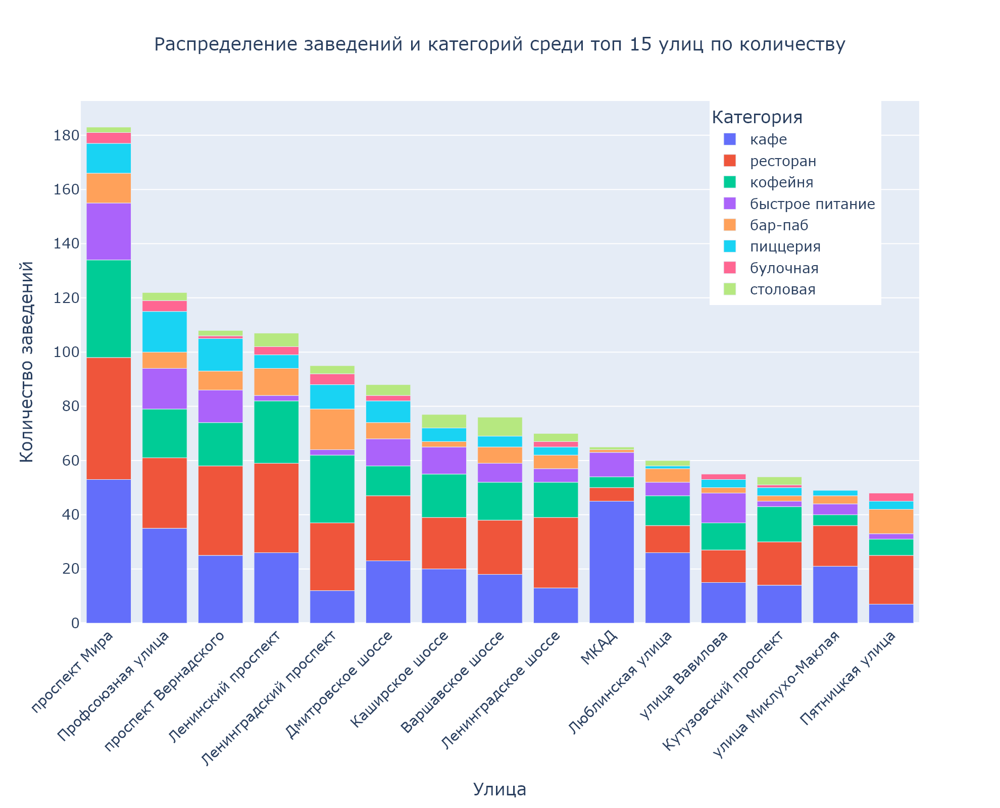

In [117]:
fig = px.bar(sorded_data_pivot_street_all_top, x='street', y='street_count', color='category',
             title='Распределение заведений и категорий среди топ 15 улиц по количеству')
fig.update_layout(title_x=0.5,
                  width=990, height=800,
                  font_size=14,
                  legend_font_size=14,
                  title_font_size=18,
                  legend=dict(x=0.75, y=1.0),
                  legend_title='Категория',
                  xaxis_title='Улица',
                  yaxis_title='Количество заведений')
fig.update_xaxes(tickangle=-45)
pio.write_image(fig, 'figure.png', width=990, height=800, scale=2)
Image('figure.png')

#### Построим нормированную столбчатую диаграмму распределения заведений и категорий по 15 улицам с наибольшим числом заведений по данным таблицы sorded_data_pivot_street_all_top в процентах

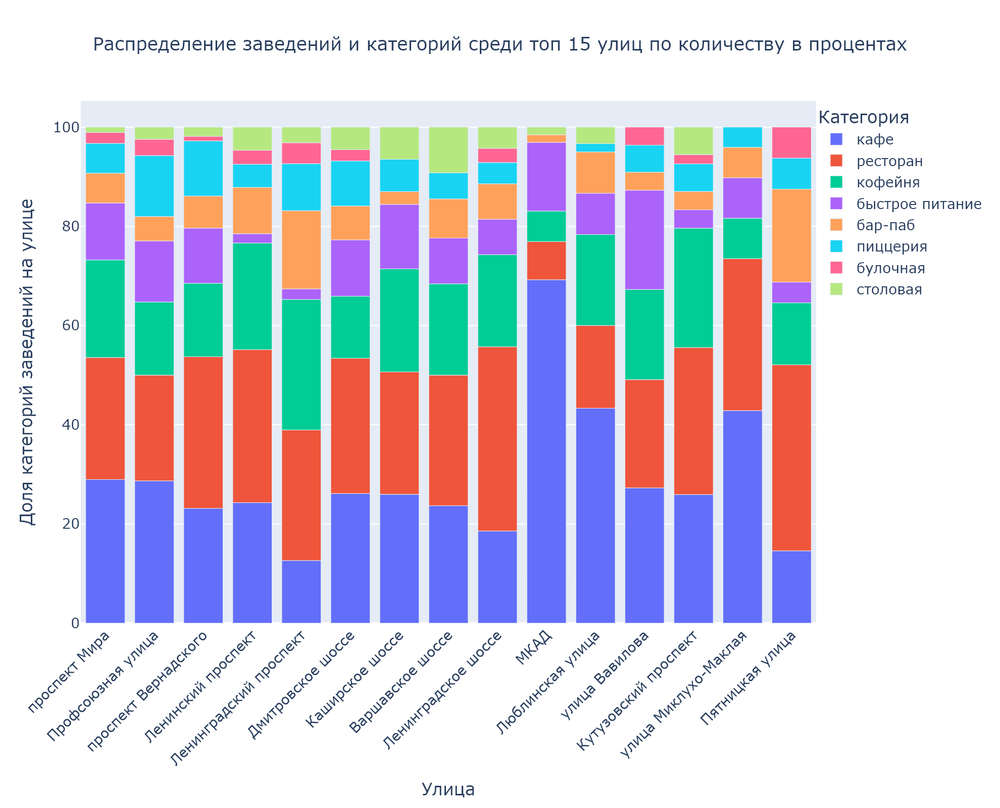

In [118]:
fig = px.bar(sorded_data_pivot_street_all_top, x='street', y='street_count', color='category',
             title='Распределение заведений и категорий среди топ 15 улиц по количеству в процентах')
fig.update_layout(title_x=0.5,
                  width=990, height=800,
                  font_size=14,
                  legend_font_size=14,
                  title_font_size=18,
                  legend=dict(x=1, y=1.0),
                  legend_title='Категория',
                  xaxis_title='Улица',
                  yaxis_title='Доля категорий заведений на улице',
                  barnorm='percent')
fig.update_xaxes(tickangle=-45)
pio.write_image(fig, 'figure.png', width=990, height=800, scale=2)
Image('figure.png')

#### Выводы по исследованию топ-15 улиц по количеству заведений

Среди топ-15 улиц по количеству заведений лидером является проспект Мира - 183 заведения или 2.19% от общего. Меньше всего в данной выборке заведений на Пятницкой улице - 48 заведений или 0.57 % от общего. По категориям заведений распределение не равномерное. Во первых не все категории заведений представлены в каждой улице. Так нет булочных на Каширском, Варшавском шоссе, МКАДе, Люблинской улице и улице Миклухо-Маклая. Нет столовых на улице Вавилова, улице Миклухо-Маклая и на Пятницкой улице. Нет пиццерий на МКАДе. Самая высокая доля кафе находится на МКАДе - 45 заведений из 65 или 69.23%. Самая высокая доля ресторанов находится на Пятницкой улице - 18 заведений из 48 или 37.5%. Самая высокая доля кофеин находится на Ленинградском проспекте 25 заведений из 95 или 26.32%.

### Исследование улиц с одним заведением

#### Создадим отфильтрованный датафрейм street_one_food в котором остануться только улицы, где расположено только одно заведение

In [119]:
street_one_food = data.groupby('street').filter(lambda x: len(x) == 1)
street_one_food

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,network_category
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False,не сетевое заведение
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False,не сетевое заведение
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False,сетевое заведение
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, cтр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False,сетевое заведение
60,Чебуречная история,кофейня,"Москва, Ландшафтный Заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,Ландшафтный Заказник Лианозовский,False,сетевое заведение
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8286,Мираж,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,0,90.0,улица Шкулёва,False,не сетевое заведение
8291,Wtfcoffee,кофейня,"Москва, улица Артюхиной, 14/8С1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица Артюхиной,False,не сетевое заведение
8314,Беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,Кузьминская улица,False,сетевое заведение
8376,Лагман хаус,кафе,"Москва, Новороссийская улица, 14, cтр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,Новороссийская улица,False,сетевое заведение


#### Отобразим на карте Москвы заведения из отфильтрованного датафрейма street_one_food

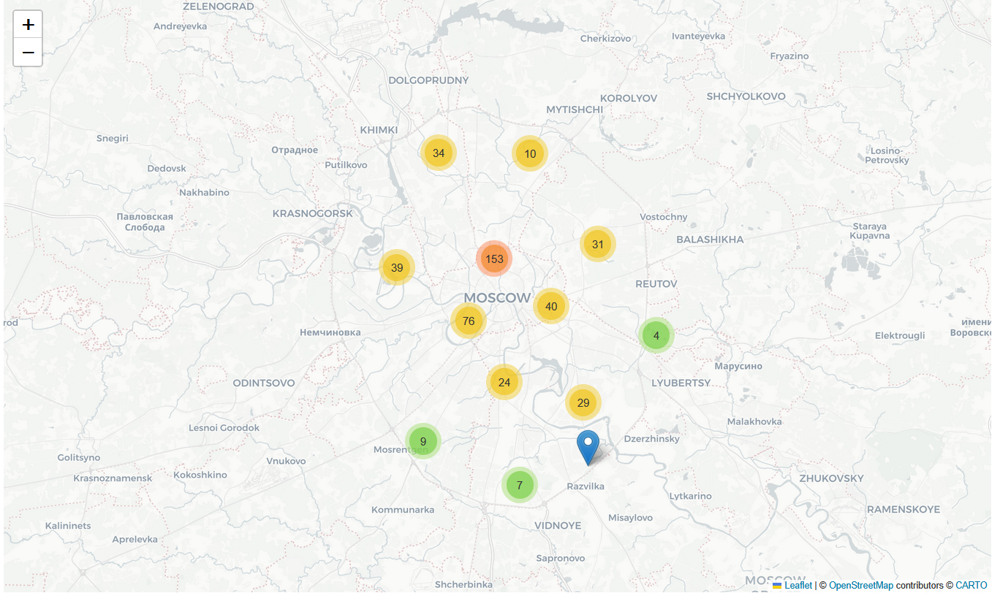

In [120]:
map_one_food = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
marker_cluster = MarkerCluster().add_to(map_one_food)
street_one_food.apply(create_clusters, axis=1)
# Для отображения карты в GitHub подгружаем ее в виде рисунка из локального места на ПК
Image(filename=r'C:\Users\Равиль\Проекты для портфолио\1. Проект по общепиту\map_one_food.png', width=1000, height=600)

#### Оценим количество заведений единственно расположеных на улице 

In [121]:
street_one_food['name'].count()

457

#### Оценим долю заведений единственно расположеных на улице относительно общего количества в процентах

In [122]:
round((street_one_food['name'].count() / data['name'].count())*100, 2)

5.44

#### Построим сводную таблицу data_pivot_chain_one методом pivot_table() со следующими столбцами:
    network_category - категория сети заведения единственно расположенного на улице
    network_category_count - количество заведений по категории сети
    network_category_count_percent - количество заведений по категории сети в процентах от общего количества

In [123]:
data_pivot_chain_one = street_one_food.pivot_table(index='network_category', values='chain', aggfunc='count').reset_index()
data_pivot_chain_one.columns = ['network_category', 'network_category_count']
data_pivot_chain_one['network_category_count_percent'] = round((data_pivot_chain_one['network_category_count'] /\
                                                            street_one_food['chain'].count()) * 100, 2)
data_pivot_chain_one

,network_category,network_category_count,network_category_count_percent
0,не сетевое заведение,324,70.9
1,сетевое заведение,133,29.1


#### Выводы по исследованию улиц с одним заведением

В представленном датафрейме имеется 457 заведений единственно расположенных на улице, что составляет 5.44% от общего числа. Как правило заведения, которые расположены на улице где больше нет других объектов общественного питания, распологаются на очень коротких улицах, проездах и переулках. В центре Москвы таких заведений больше чем на окраинах. 324 таких заведений или 70.9% являются не сетевыми.

### Исследование средних чеков заведений

#### Построим сводную таблицу data_pivot_avg_bill методом pivot_table() со следующими столбцами:
    district - административный район, где находится заведение
    middle_avg_bill_count - количество заведений по районам по которым есть данные по среднему чеку заведения
    middle_avg_bill_median - медиана среднего чека заведения по административным районам
    middle_avg_bill_percent - количество заведений по административный районам по которым есть данные по среднему чеку
    заведения в процентах от общего количеста данных по чекам

In [124]:
data_pivot_avg_bill = data.pivot_table(index='district', values='middle_avg_bill', aggfunc=['count', 'median']).\
reset_index()
data_pivot_avg_bill.columns = ['district', 'middle_avg_bill_count', 'middle_avg_bill_median']
data_pivot_avg_bill['middle_avg_bill_percent'] = round((data_pivot_avg_bill['middle_avg_bill_count'] /\
                                                        data['middle_avg_bill'].count()) * 100, 2)
data_pivot_avg_bill

,district,middle_avg_bill_count,middle_avg_bill_median,middle_avg_bill_percent
0,Восточный административный округ,260,575.0,8.26
1,Западный административный округ,306,1000.0,9.72
2,Северный административный округ,322,650.0,10.23
3,Северо-Восточный административный округ,301,500.0,9.56
4,Северо-Западный административный округ,157,700.0,4.99
5,Центральный административный округ,1060,1000.0,33.66
6,Юго-Восточный административный округ,194,450.0,6.16
7,Юго-Западный административный округ,235,600.0,7.46
8,Южный административный округ,314,500.0,9.97


#### Отсортируем сводную таблицу data_pivot_avg_bill по медиане среднего чека по убыванию

In [125]:
sortded_data_pivot_avg_bill = data_pivot_avg_bill.sort_values(by=\
                             'middle_avg_bill_median', ascending=False).reset_index(drop=True)
sortded_data_pivot_avg_bill

,district,middle_avg_bill_count,middle_avg_bill_median,middle_avg_bill_percent
0,Западный административный округ,306,1000.0,9.72
1,Центральный административный округ,1060,1000.0,33.66
2,Северо-Западный административный округ,157,700.0,4.99
3,Северный административный округ,322,650.0,10.23
4,Юго-Западный административный округ,235,600.0,7.46
5,Восточный административный округ,260,575.0,8.26
6,Северо-Восточный административный округ,301,500.0,9.56
7,Южный административный округ,314,500.0,9.97
8,Юго-Восточный административный округ,194,450.0,6.16


#### Построим фоновую картограмму с медианным чеком заведений для каждого района

##### Загружаем JSON-файл с границами округов Москвы и открываем файл в режиме чтения с кодировкой UTF-8 с последующей загрузкой данных из файла

In [126]:
state_geo = r'C:\Users\Равиль\Проекты для портфолио\1. Проект по общепиту\admin_level_geomap.geojson'
with open(state_geo, 'r', encoding='utf-8') as f:
     state_geo_data = json.load(f)

##### Определяем широту и долготу центра Москвы и создаем ее карту

In [127]:
moscow_lat, moscow_lng = 55.751244, 37.618423
map_avg_bill = Map(location=[moscow_lat, moscow_lng], zoom_start=9.5, tiles='Cartodb Positron')

##### Cоздаём хороплет с помощью конструктора Choropleth, добавляем его на карту и выводим карту на экран

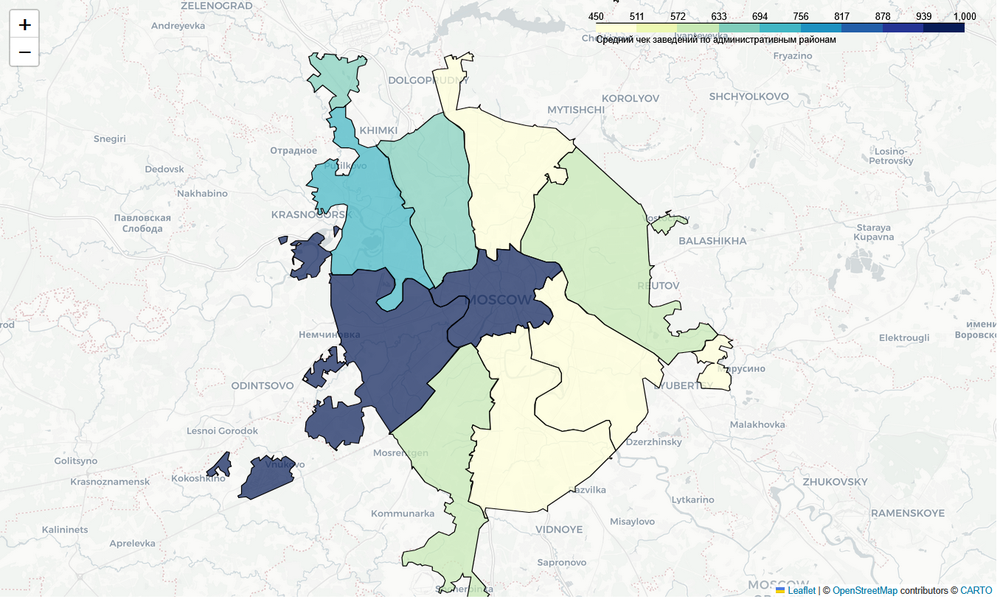

In [128]:
Choropleth(
    geo_data=state_geo_data,
    data=sortded_data_pivot_avg_bill,
    columns=['district', 'middle_avg_bill_median'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    legend_name='Средний чек заведений по административным районам',
    bins=9,
).add_to(map_avg_bill)
# Для отображения карты в GitHub подгружаем ее в виде рисунка из локального места на ПК
Image(filename=r'C:\Users\Равиль\Проекты для портфолио\1. Проект по общепиту\map_avg_bill.png', width=1000, height=600)

#### Создадим функцию calculate_distance, которая с помощью библитеки haversine будет определять расстояние от заведения до центра Москвы в километрах

In [129]:
def calculate_distance(moscow_lat, moscow_lng, point_lat, point_lng):
    moscow_coord = (moscow_lat, moscow_lng)
    point_coord = (point_lat, point_lng)
    distance = haversine(moscow_coord, point_coord, unit=Unit.KILOMETERS)
    return distance

#### Создадим новый столбец distance с расстоянением заведения до центра Москвы, использую функцию calculate_distance и оценим результат добавления в датафрейм

In [130]:
data['distance'] = data[['lat', 'lng']].apply(lambda row: calculate_distance(moscow_lat, moscow_lng, \
                                                                             row['lat'], row['lng']), axis=1)
data.head(10).T

,0,1,2,3,4,5,6,7,8,9
name,Wowфли,Четыре комнаты,Хазри,Dormouse coffee shop,Иль марко,Sergio pizza,Огни города,Mr. уголёк,Donna maria,Готика
category,кафе,ресторан,кафе,кофейня,пиццерия,пиццерия,бар-паб,быстрое питание,ресторан,кафе
address,"Москва, улица Дыбенко, 7/1","Москва, улица Дыбенко, 36, корп. 1","Москва, Клязьминская улица, 15","Москва, улица Маршала Федоренко, 12","Москва, Правобережная улица, 1Б","Москва, Ижорская улица, Вл8Б","Москва, Клязьминская улица, 9, cтр. 3","Москва, Клязьминская улица, 9, cтр. 3","Москва, Дмитровское шоссе, 107, корп. 4","Москва, Ангарская улица, 39"
district,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ
hours,"ежедневно, 10:00–22:00","ежедневно, 10:00–22:00","пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...","ежедневно, 09:00–22:00","ежедневно, 10:00–22:00","ежедневно, 10:00–23:00",пн 15:00–04:00; вт-вс 15:00–05:00,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...","ежедневно, 10:00–22:00","ежедневно, 12:00–00:00"
lat,55.878494,55.875801,55.889146,55.881608,55.881166,55.88801,55.890752,55.890636,55.880045,55.879038
lng,37.47886,37.484479,37.525901,37.48886,37.449357,37.509573,37.524653,37.524303,37.539006,37.524487
rating,5.0,4.5,4.6,5.0,5.0,4.6,4.4,4.7,4.8,4.3
price,NaN,выше среднего,средние,NaN,средние,средние,средние,средние,средние,средние
avg_bill,NaN,Средний счёт:1500–1600 ₽,Средний счёт:от 1000 ₽,Цена чашки капучино:155–185 ₽,Средний счёт:400–600 ₽,NaN,Средний счёт:199 ₽,Средний счёт:200–300 ₽,Средний счёт:от 500 ₽,Средний счёт:1000–1200 ₽


#### Построим диаграмму рассеяния зависимости среднего чека заведения от расстояний до центра Москвы

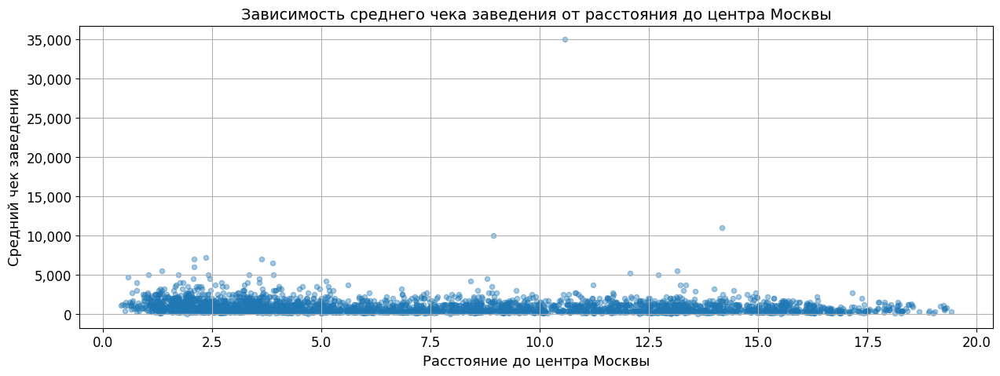

In [131]:
data.plot(x='distance', y='middle_avg_bill', kind='scatter', figsize=(15, 5), alpha=0.4)
plt.ticklabel_format(style='plain')
plt.grid(True)
formatter = ticker.FuncFormatter(lambda x, _: '{:,}'.format(int(x)))
plt.gca().yaxis.set_major_formatter(formatter)
plt.title('Зависимость среднего чека заведения от расстояния до центра Москвы', fontsize=14)
plt.xlabel('Расстояние до центра Москвы', fontsize=13)
plt.ylabel('Средний чек заведения', fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

#### Посчитаем коэффициент корреляции Пирсона между средним чеком заведения и расстоянием до центра Москвы

In [132]:
round(data['distance'].corr(data['middle_avg_bill']), 2)

-0.16

#### Выводы по исследованию средних чеков заведений

Самый высокий средний чек в 1000 рублей присутствует у заведений в центральном и западном административном районе. Самый низкий средний чек в 450 рублей в юго-восточном административном округе. Зависимость между средним чеком заведения и расстоянием до центра Москвы практически отсутствует, учитывая, что коэффициент корреляции Пирсона составляет -0.16. Таким образом, достаточно сложо сказать, что чем дальше расстояние от центра Москвы тем ниже средний чек заведения, так как, например один и тот же средний чек примерно в 5000 рублей есть как в первом километре, так и 13-14 километре от центра Москвы.

### Исследование заведений с низким рейтингом

#### Создадим отфильтрованный датафрейм куда войдут заведения с рейтингом 3.5 и ниже

In [133]:
data_bad_rating = data.query('rating <= 3.5')
data_bad_rating.head(20).T

,47,49,53,56,132,150,166,167,173,181,183,187,189,191,193,194,200,215,217,274
name,Кафе,2u-ту-ю,Royal coffee,Рыба из тандыра,Пекарня-шаурма,Правда,Бута бар,Узбекистан,Булкер,Fire,Кафе,Cofefest,Кафе,Кулинарный дворик 1996,Яндекс лавка,Ленкорань,Wild bean,Кафе,16 июня,Чайхана
category,кафе,пиццерия,кофейня,быстрое питание,быстрое питание,бар-паб,кафе,быстрое питание,столовая,кафе,кафе,кофейня,кафе,кафе,ресторан,кафе,кофейня,кафе,кафе,кафе
address,"Москва, улица Маршала Федоренко, 7","Москва, Ижорская улица, 8А","Москва, Правобережная улица, 1Б","Москва, Коровинское шоссе, 46, cтр. 5","Москва, Алтуфьевское шоссе, 84","Москва, Дмитровское шоссе, 124А","Москва, Илимская улица, 1, корп. 3","Москва, Алтуфьевское шоссе, 84","Москва, Дмитровское шоссе, 100, корп. 2","Москва, улица Пришвина, 3, cтр. 2","Москва, Алтуфьевское шоссе, 106","Москва, Инженерная улица, 3С1","Москва, парк Ангарские Пруды","Москва, бульвар Академика Ландау, 1","Москва, Алтуфьевское шоссе, 79А, cтр. 25","Москва, Дмитровское шоссе, 165, корп. 1","Москва, Дмитровское шоссе, 107Е","Москва, парк Ангарские Пруды","Москва, бульвар Академика Ландау, 3","Москва, Широкая улица, 12"
district,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Восточный административный округ,Северо-Восточный административный округ,Северо-Восточный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Восточный административный округ,Северо-Восточный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Восточный административный округ,Северо-Восточный административный округ,Северный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Восточный административный округ
hours,"ежедневно, 11:00–00:00","ежедневно, круглосуточно","ежедневно, 10:00–22:00",NaN,"ежедневно, круглосуточно","ежедневно, 08:00–23:00","ежедневно, 11:00–23:00","ежедневно, 08:00–23:00",пн-пт 08:00–16:00,"ежедневно, 16:00–04:00","ежедневно, круглосуточно",пн-пт 08:00–19:00,"ежедневно, 09:00–23:00","ежедневно, 10:00–23:00","ежедневно, 07:00–00:00","ежедневно, 06:00–20:00","ежедневно, круглосуточно","ежедневно, 10:00–22:00",NaN,NaN
lat,55.880306,55.88616,55.880622,55.88801,55.895949,55.924367,55.891173,55.896186,55.882577,55.890078,55.907607,55.87844,55.880327,55.920297,55.886778,55.914574,55.878477,55.881438,55.92037,55.88684
lng,37.48976,37.508784,37.448529,37.51596,37.5881,37.549657,37.569405,37.588214,37.549715,37.593237,37.588674,37.580627,37.530786,37.550611,37.584891,37.539103,37.543426,37.531848,37.55215,37.65961
rating,2.8,2.7,3.1,1.5,2.0,1.4,3.3,1.4,3.5,1.4,3.2,2.9,3.2,2.7,3.3,1.4,3.5,3.2,1.4,3.0
price,NaN,NaN,NaN,NaN,NaN,NaN,средние,NaN,низкие,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
avg_bill,NaN,Средний счёт:900 ₽,NaN,NaN,NaN,NaN,Средний счёт:800–1000 ₽,NaN,Средний счёт:240 ₽,NaN,NaN,NaN,NaN,Средний счёт:500–1000 ₽,NaN,NaN,NaN,NaN,NaN,NaN


#### Оценим сколько есть заведений с рейтингом 3.5 и ниже

In [134]:
len(data_bad_rating)

506

#### Оценим сколько есть заведений с рейтингом 3.5 и ниже в процентах от общего количества всез заведений в датасете

In [135]:
round((len(data_bad_rating) / len(data))*100, 2)

6.02

#### Построим сводную таблицу data_pivot_bad_rating методом pivot_table() со следующими столбцами:
    category - категория заведения с низким рейтингом
    middle_avg_bill_count - количество заведений по которым есть данные по среднему чеку
    middle_avg_bill_median - медиана среднего чека заведения с низким рейтингом по категориям
    rating_count - количество заведений с низким рейтингом по категориям
    rating_count_percent - количество заведений с низким рейтингом по категориям в процентах от общего количества таких 
    заведений

In [136]:
data_pivot_bad_rating = data_bad_rating.pivot_table(index = 'category', values = ['rating', 'middle_avg_bill'], \
                                          aggfunc = {'rating' : 'count', 'middle_avg_bill' : ['count', 'median']}).\
reset_index()
data_pivot_bad_rating.columns = ['category', 'middle_avg_bill_count', 'middle_avg_bill_median', 'rating_count']
data_pivot_bad_rating['rating_count_percent'] = round((data_pivot_bad_rating['rating_count'] /\
                                                       data_pivot_bad_rating['rating_count'].sum()) * 100, 2)
data_pivot_bad_rating

,category,middle_avg_bill_count,middle_avg_bill_median,rating_count,rating_count_percent
0,бар-паб,2,257.5,16,3.16
1,булочная,3,450.0,10,1.98
2,быстрое питание,22,300.0,73,14.43
3,кафе,41,400.0,250,49.41
4,кофейня,4,425.0,49,9.68
5,пиццерия,6,737.5,13,2.57
6,ресторан,8,575.0,79,15.61
7,столовая,6,262.5,16,3.16


#### Отсортируем сводную таблицу data_pivot_bad_rating по количеству заведений по убыванию

In [137]:
sorted_data_pivot_bad_rating = data_pivot_bad_rating.sort_values(by=['rating_count'],\
                                                                 ascending=False).reset_index(drop=True)
sorted_data_pivot_bad_rating

,category,middle_avg_bill_count,middle_avg_bill_median,rating_count,rating_count_percent
0,кафе,41,400.0,250,49.41
1,ресторан,8,575.0,79,15.61
2,быстрое питание,22,300.0,73,14.43
3,кофейня,4,425.0,49,9.68
4,бар-паб,2,257.5,16,3.16
5,столовая,6,262.5,16,3.16
6,пиццерия,6,737.5,13,2.57
7,булочная,3,450.0,10,1.98


#### Отсортируем сводную таблицу data_pivot_bad_rating по медиане среднего чека заведения по убыванию

In [138]:
sorted_data_pivot_bad_rating_2 = data_pivot_bad_rating.sort_values(by=['middle_avg_bill_count', 'middle_avg_bill_median'],\
                                                                 ascending=False).reset_index(drop=True)
sorted_data_pivot_bad_rating_2

,category,middle_avg_bill_count,middle_avg_bill_median,rating_count,rating_count_percent
0,кафе,41,400.0,250,49.41
1,быстрое питание,22,300.0,73,14.43
2,ресторан,8,575.0,79,15.61
3,пиццерия,6,737.5,13,2.57
4,столовая,6,262.5,16,3.16
5,кофейня,4,425.0,49,9.68
6,булочная,3,450.0,10,1.98
7,бар-паб,2,257.5,16,3.16


#### Оценим общие числовые характеристики по среднему чеку заведения по столбцу middle_avg_bill

In [139]:
data['middle_avg_bill'].describe()

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

#### Построим столбчатую диаграмму распередение количества заведений по категориях с плохим рейтингом по данным сводной таблицы sorted_data_pivot_bad_rating

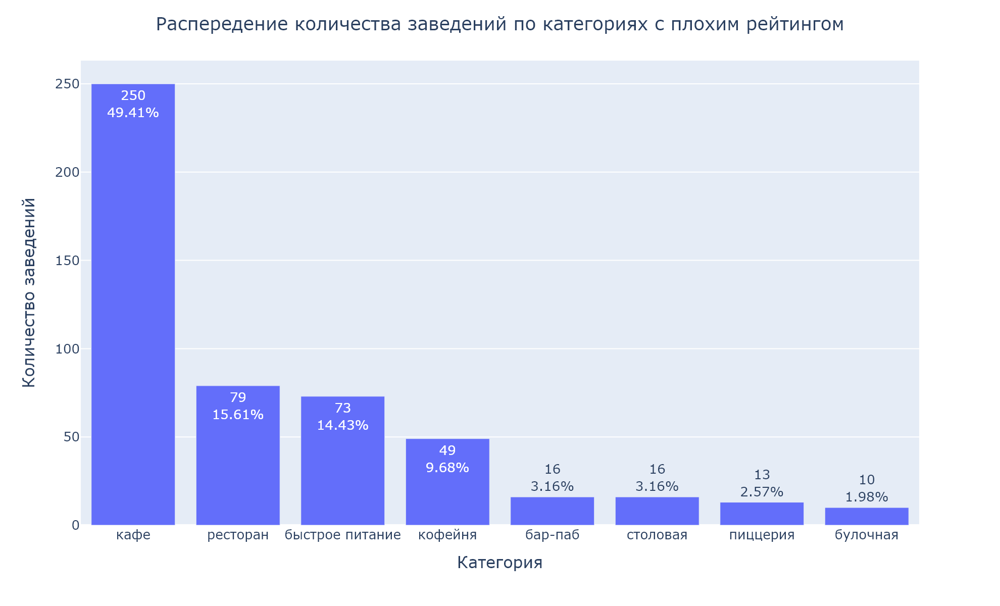

In [140]:
sorted_data_pivot_bad_rating['text'] = sorted_data_pivot_bad_rating.apply(lambda x: \
                                       f'{x["rating_count"]:.0f}<br>{x["rating_count_percent"]:.2f}%', axis=1)
fig = px.bar(sorted_data_pivot_bad_rating,
             x='category',
             y='rating_count',
             text='text')
fig.update_layout(title='Распередение количества заведений по категориях с плохим рейтингом', title_x=0.5,
                  xaxis_title='Категория',
                  yaxis_title='Количество заведений',
                  width=990,
                  height=600,
                  font_size=13)
pio.write_image(fig, 'figure.png', width=990, height=600, scale=2)
Image('figure.png')

#### Построим диаграмму рассеяния зависимости среднего чека заведения от его рейтинга

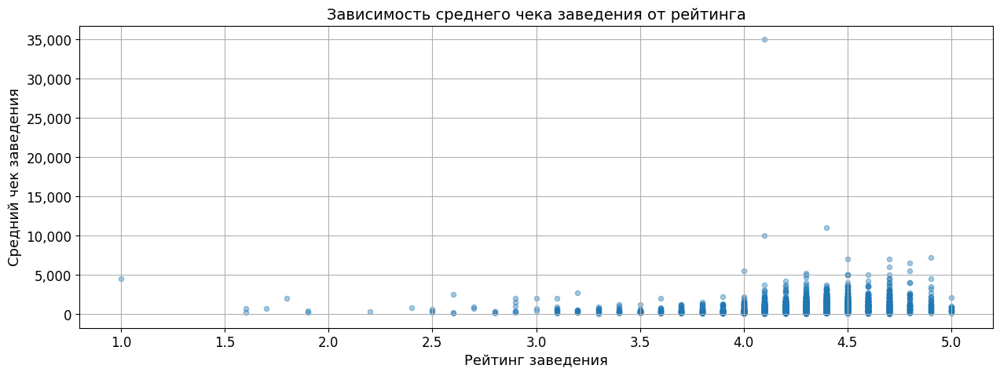

In [141]:
data.plot(x='rating', y='middle_avg_bill', kind='scatter', figsize=(15, 5), alpha=0.4)
plt.ticklabel_format(style='plain')
plt.grid(True)
formatter = ticker.FuncFormatter(lambda x, _: '{:,}'.format(int(x)))
plt.gca().yaxis.set_major_formatter(formatter)
plt.title('Зависимость среднего чека заведения от рейтинга', fontsize=14)
plt.xlabel('Рейтинг заведения', fontsize=13)
plt.ylabel('Средний чек заведения', fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

#### Посчитаем коэффициент корреляции Пирсона между средним чеком заведения и его рейтингом

In [142]:
round(data['rating'].corr(data['middle_avg_bill']), 2)

0.18

#### Вывод по исследованию заведений с низким рейтингом

1. Всего в датафрейме представлено 506 заведений или 6.02% с рейтингом 3.5 и ниже.
2. Среди таких заведений наибольшая доля присутствет у кафе - 250 заведений или 49.41%. Далее идут рестораны - 79 заведений или 15.61%, быстрое питание 73 заведения или 14.43%, кофейни 49 заведений или 9.68%. Доля остальных заведений не превышает 5%.
3. Среди данных заведений наибольший средний чек имеется у ресторанов - 575 рублей, кафе - 400 рублей и быстрого питания - 300 рублей. Средний чек в других категориях оценить достаточно сложно, так как данных по ним достаточно мало.
4. Таким образом, с учетом того, что медиана среднего чека составляет 750 рублей по всем заведениям датасета, можно сказать, что в заведениях с низким рейтингом достаточно низкий средний чек, однако говорить о четкой зависимости между средним чеком заведения и рейтингом не приходится, учитывая коэффициент коррелляции 0.18.

### Исследование кофейн

#### Создадим отфильтрованный датафрейм, где будут присутстовать только кофейни

In [143]:
data_coffee_house = data.query('category == "кофейня"')
data_coffee_house.head(10).T

,3,25,45,46,52,53,58,60,64,66
name,Dormouse coffee shop,В парке вкуснее,9 bar coffee,Cofefest,Cofix,Royal coffee,Coffeekaldi's,Чебуречная история,Testo мания,Молинари
category,кофейня,кофейня,кофейня,кофейня,кофейня,кофейня,кофейня,кофейня,кофейня,кофейня
address,"Москва, улица Маршала Федоренко, 12","Москва, парк Левобережный","Москва, Коровинское шоссе, 41, cтр. 1","Москва, улица Маршала Федоренко, 6С1","Москва, улица Дыбенко, 7/1","Москва, Правобережная улица, 1Б","Москва, Угличская улица, 13, cтр. 8","Москва, Ландшафтный Заказник Лианозовский","Москва, Лианозовский парк Культуры И Отдыха","Москва, Алтуфьевское шоссе, 70, корп. 1"
district,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Восточный административный округ,Северо-Восточный административный округ,Северо-Восточный административный округ
hours,"ежедневно, 09:00–22:00","ежедневно, 10:00–21:00",пн-пт 08:00–18:00,пн-пт 09:00–19:00,"ежедневно, 08:00–22:00","ежедневно, 10:00–22:00","ежедневно, 09:00–22:00","ежедневно, 10:00–22:00","ежедневно, 09:00–21:00","ежедневно, 10:00–22:00"
lat,55.881608,55.878453,55.885837,55.879934,55.878531,55.880622,55.900316,55.899845,55.900058,55.887887
lng,37.48886,37.460028,37.513422,37.492522,37.479395,37.448529,37.570558,37.570488,37.570544,37.588294
rating,5.0,4.3,4.0,3.6,3.8,3.1,4.1,4.9,4.1,4.8
price,NaN,NaN,NaN,NaN,NaN,NaN,средние,NaN,NaN,NaN
avg_bill,Цена чашки капучино:155–185 ₽,NaN,NaN,NaN,NaN,NaN,Средний счёт:500–800 ₽,NaN,NaN,NaN


#### Оценим сколько всего кофейн в датасете

In [144]:
len(data_coffee_house)

1413

#### Оценим долю кофеен в процентах от общего количества заведений

In [145]:
round((len(data_coffee_house) / len(data))*100, 2)

16.82

#### Построим сводную таблицу data_pivot_coffee_house методом pivot_table() со следующими столбцами:
    district - административный район, в котором находится кофейня
    coffee_house_count - количество кофеен в административном районе
    coffee_house_count_percent - количество кофеен в административном районе в процентах от общего

In [146]:
data_pivot_coffee_house = data_coffee_house.pivot_table(index='district', values='name', aggfunc='count').reset_index()
data_pivot_coffee_house.columns = ['district', 'coffee_house_count']
data_pivot_coffee_house['coffee_house_count_percent'] = round((data_pivot_coffee_house['coffee_house_count'] / \
                                                        data_pivot_coffee_house['coffee_house_count'].sum())*100, 2)
data_pivot_coffee_house

,district,coffee_house_count,coffee_house_count_percent
0,Восточный административный округ,105,7.43
1,Западный административный округ,150,10.62
2,Северный административный округ,193,13.66
3,Северо-Восточный административный округ,159,11.25
4,Северо-Западный административный округ,62,4.39
5,Центральный административный округ,428,30.29
6,Юго-Восточный административный округ,89,6.30
7,Юго-Западный административный округ,96,6.79
8,Южный административный округ,131,9.27


#### Отсортируем таблицу data_pivot_coffee_house по количеству кофеен по убыванию

In [147]:
sorted_data_pivot_coffee_house = data_pivot_coffee_house.sort_values(by='coffee_house_count', ascending=\
                                                                     False).reset_index(drop=True)
sorted_data_pivot_coffee_house

,district,coffee_house_count,coffee_house_count_percent
0,Центральный административный округ,428,30.29
1,Северный административный округ,193,13.66
2,Северо-Восточный административный округ,159,11.25
3,Западный административный округ,150,10.62
4,Южный административный округ,131,9.27
5,Восточный административный округ,105,7.43
6,Юго-Западный административный округ,96,6.79
7,Юго-Восточный административный округ,89,6.30
8,Северо-Западный административный округ,62,4.39


#### Построим фоновую картограмму распределения кофеен по административным районам

##### Загружаем JSON-файл с границами округов Москвы и открываем файл в режиме чтения с кодировкой UTF-8 с последующей загрузкой данных из файла

In [148]:
state_geo = r'C:\Users\Равиль\Проекты для портфолио\1. Проект по общепиту\admin_level_geomap.geojson'
with open(state_geo, 'r', encoding='utf-8') as f:
     state_geo_data = json.load(f)

##### Определяем широту и долготу центра Москвы и создаем ее карту

In [149]:
moscow_lat, moscow_lng = 55.751244, 37.618423
map_coffee_house = Map(location=[moscow_lat, moscow_lng], zoom_start=9.5, tiles='Cartodb Positron')

##### Cоздаём хороплет с помощью конструктора Choropleth, добавляем его на карту и выводим карту на экран

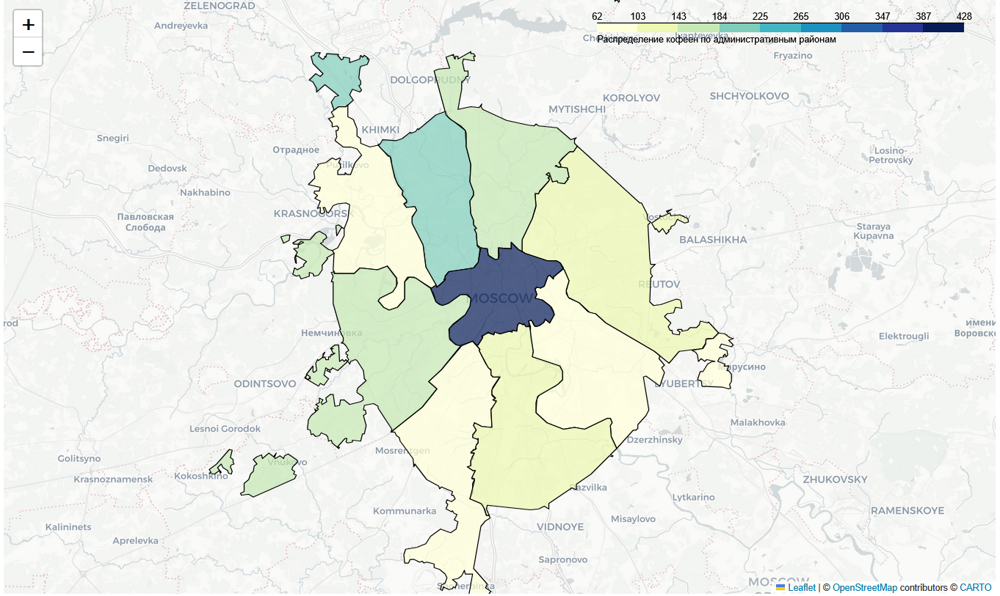

In [150]:
Choropleth(
    geo_data=state_geo_data,
    data=sorted_data_pivot_coffee_house,
    columns=['district', 'coffee_house_count'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    legend_name='Распределение кофеен по административным районам',
    bins=9
).add_to(map_coffee_house)
# Для отображения карты в GitHub подгружаем ее в виде рисунка из локального места на ПК
Image(filename=r'C:\Users\Равиль\Проекты для портфолио\1. Проект по общепиту\map_coffee_house.png', width=1000, height=600)

#### Отобразим на карте Москвы все кофейни из отфильтрованного датафрейма data_coffee_house

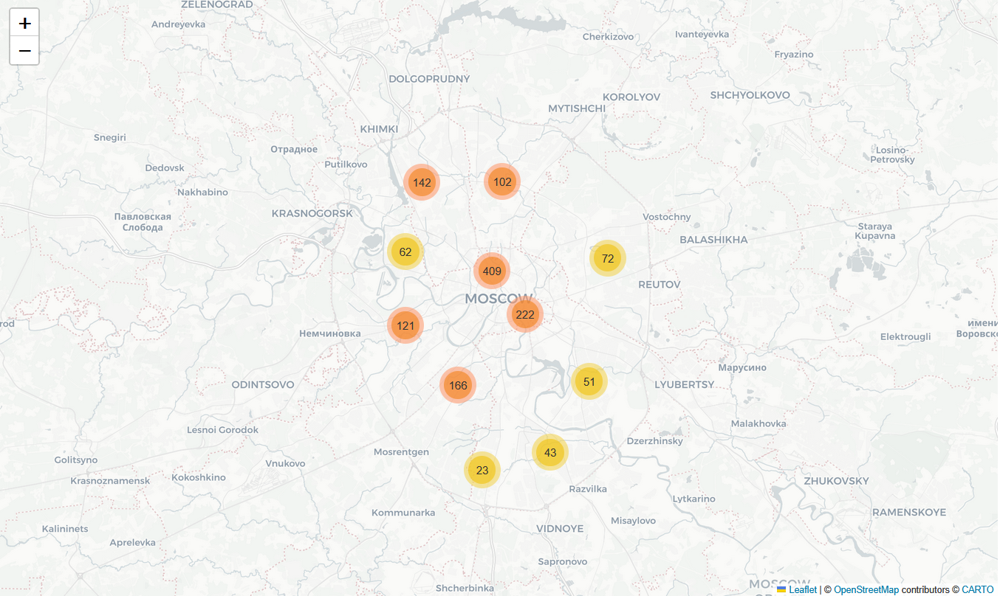

In [151]:
map_coffee_house_clusters = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
marker_cluster = MarkerCluster().add_to(map_coffee_house_clusters)
data_coffee_house.apply(create_clusters, axis=1)
# Для отображения карты в GitHub подгружаем ее в виде рисунка из локального места на ПК
Image(filename=r'C:\Users\Равиль\Проекты для портфолио\1. Проект по общепиту\map_coffee_house_clusters.png', \
      width=1000, height=600)

#### Создадим сводную таблицу data_24_coffee_house со следующими столбцами:
    is_24/7 - показатель круглосуточной работы кофейни
    category_count - количество кофеин по показателю круглосуточной работы заведения
    category_count_percent - количество кофеин по показателю круглосуточной работы заведения в процентах от их общего
    количества

In [152]:
data_24_coffee_house = data_coffee_house.groupby('is_24/7').size().reset_index(name='category_count')
data_24_coffee_house['category_count_percent'] = round((data_24_coffee_house['category_count'] / \
                                                        data_24_coffee_house['category_count'].sum())*100, 2)
data_24_coffee_house

,is_24/7,category_count,category_count_percent
0,False,1354,95.82
1,True,59,4.18


#### Оценим общие числовые характеристики рейтинга кофеин

In [153]:
data_coffee_house['rating'].describe()

count    1413.000000
mean        4.277282
std         0.372250
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

#### Построим сводную таблицу pivot_rating_district методом pivot_table() со следующими столбцами:
    district - административный район заведения
    rating_coffee_count - количество кофеен в административном районе
    rating_coffee_mean - средний рейтинг кофеин по административному району

In [154]:
pivot_coffee_house = data_coffee_house.pivot_table(index='district', values='rating', aggfunc=['count', 'mean']).\
reset_index()
pivot_coffee_house.columns = ['district', 'rating_coffee_count', 'rating_coffee_mean']
pivot_coffee_house['rating_coffee_mean'] = round(pivot_coffee_house['rating_coffee_mean'], 2)
pivot_coffee_house

,district,rating_coffee_count,rating_coffee_mean
0,Восточный административный округ,105,4.28
1,Западный административный округ,150,4.20
2,Северный административный округ,193,4.29
3,Северо-Восточный административный округ,159,4.22
4,Северо-Западный административный округ,62,4.33
5,Центральный административный округ,428,4.34
6,Юго-Восточный административный округ,89,4.23
7,Юго-Западный административный округ,96,4.28
8,Южный административный округ,131,4.23


#### Остортируем сводную таблицу pivot_rating_district по среднему рейтингу по убыванию

In [155]:
sorted_pivot_coffee_house = pivot_coffee_house.sort_values(by='rating_coffee_mean', ascending=False).reset_index(drop=True)
sorted_pivot_coffee_house

,district,rating_coffee_count,rating_coffee_mean
0,Центральный административный округ,428,4.34
1,Северо-Западный административный округ,62,4.33
2,Северный административный округ,193,4.29
3,Восточный административный округ,105,4.28
4,Юго-Западный административный округ,96,4.28
5,Юго-Восточный административный округ,89,4.23
6,Южный административный округ,131,4.23
7,Северо-Восточный административный округ,159,4.22
8,Западный административный округ,150,4.20


#### Построим фоновую картограмму со средним рейтингом кофеин каждого района

##### Загружаем JSON-файл с границами округов Москвы и открываем файл в режиме чтения с кодировкой UTF-8 с последующей загрузкой данных из файла

In [156]:
state_geo = r'C:\Users\Равиль\Проекты для портфолио\1. Проект по общепиту\admin_level_geomap.geojson'
with open(state_geo, 'r', encoding='utf-8') as f:
     state_geo_data = json.load(f)

##### Определяем широту и долготу центра Москвы и создаем ее карту

In [157]:
moscow_lat, moscow_lng = 55.751244, 37.618423
map_avg_rating_coffee = Map(location=[moscow_lat, moscow_lng], zoom_start=9.5, tiles='Cartodb Positron')

##### Cоздаём хороплет с помощью конструктора Choropleth, добавляем его на карту и выводим карту на экран

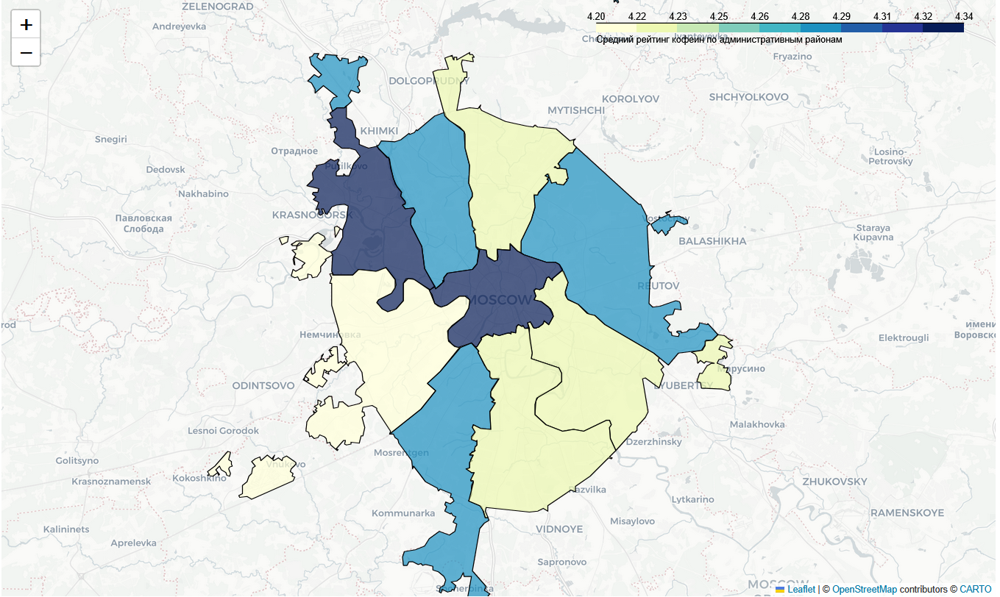

In [158]:
Choropleth(
    geo_data=state_geo_data,
    data=sorted_pivot_coffee_house,
    columns=['district', 'rating_coffee_mean'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    legend_name='Средний рейтинг кофеин по административным районам',
    bins=9
).add_to(map_avg_rating_coffee)
# Для отображения карты в GitHub подгружаем ее в виде рисунка из локального места на ПК
Image(filename=r'C:\Users\Равиль\Проекты для портфолио\1. Проект по общепиту\map_avg_rating_coffee.png', \
      width=1000, height=600)

#### Оценим общие числовые характеристики средней стоимости чашки кофе в датасете для кофеин

In [159]:
data_coffee_house['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

#### Оценим долю кофеин по которым есть информация о средней стоимости чашки кофе в датасете для кофейн в процентах

In [160]:
round((data_coffee_house['middle_coffee_cup'].count() / data_coffee_house['name'].count())*100, 2)

36.87

#### Построим сводную таблицу data_pivot_coffee_cup методом pivot_table() со следующими столбцами:
    district - административный район, где находится кофейня
    middle_coffee_cup_count - количество заведений по районам по которым есть данные по средней стоимости чашки капучино
    middle_coffee_cup_median - медиана средней стоимости чашки капучино по административным районам
    middle_coffee_cup_percent - количество кофеин по административный районам по которым есть данные по по средней стоимости чашки капучино в процентах от общего количеста данных по стоимости

In [161]:
data_pivot_coffee_cup = data_coffee_house.pivot_table(index='district', values='middle_coffee_cup', aggfunc=\
                                                      ['count', 'median']).reset_index()
data_pivot_coffee_cup.columns = ['district', 'middle_coffee_cup_count', 'middle_coffee_cup_median']
data_pivot_coffee_cup['middle_coffee_cup_percent'] = round((data_pivot_coffee_cup['middle_coffee_cup_count'] /\
                                                        data_pivot_coffee_cup['middle_coffee_cup_count'].sum()) * 100, 2)
data_pivot_coffee_cup

,district,middle_coffee_cup_count,middle_coffee_cup_median,middle_coffee_cup_percent
0,Восточный административный округ,42,135.0,8.06
1,Западный административный округ,49,189.0,9.40
2,Северный административный округ,76,159.0,14.59
3,Северо-Восточный административный округ,60,162.5,11.52
4,Северо-Западный административный округ,21,165.0,4.03
5,Центральный административный округ,162,190.0,31.09
6,Юго-Восточный административный округ,34,147.5,6.53
7,Юго-Западный административный округ,34,198.0,6.53
8,Южный административный округ,43,150.0,8.25


#### Отсортируем сводную таблицу data_pivot_coffee_cup по медиане средней стоимости чашки капучино по убыванию

In [162]:
sortded_data_pivot_coffee_cup = data_pivot_coffee_cup.sort_values(by=\
                             'middle_coffee_cup_median', ascending=False).reset_index(drop=True)
sortded_data_pivot_coffee_cup

,district,middle_coffee_cup_count,middle_coffee_cup_median,middle_coffee_cup_percent
0,Юго-Западный административный округ,34,198.0,6.53
1,Центральный административный округ,162,190.0,31.09
2,Западный административный округ,49,189.0,9.40
3,Северо-Западный административный округ,21,165.0,4.03
4,Северо-Восточный административный округ,60,162.5,11.52
5,Северный административный округ,76,159.0,14.59
6,Южный административный округ,43,150.0,8.25
7,Юго-Восточный административный округ,34,147.5,6.53
8,Восточный административный округ,42,135.0,8.06


#### Построим фоновую картограмму со средней стоимостью чашки капучино в кофейнях

##### Загружаем JSON-файл с границами округов Москвы и открываем файл в режиме чтения с кодировкой UTF-8 с последующей загрузкой данных из файла

In [163]:
state_geo = r'C:\Users\Равиль\Проекты для портфолио\1. Проект по общепиту\admin_level_geomap.geojson'
with open(state_geo, 'r', encoding='utf-8') as f:
     state_geo_data = json.load(f)

##### Определяем широту и долготу центра Москвы и создаем ее карту

In [164]:
moscow_lat, moscow_lng = 55.751244, 37.618423
map_avg_coffee_cup = Map(location=[moscow_lat, moscow_lng], zoom_start=9.5, tiles='Cartodb Positron')

##### Cоздаём хороплет с помощью конструктора Choropleth, добавляем его на карту и выводим карту на экран

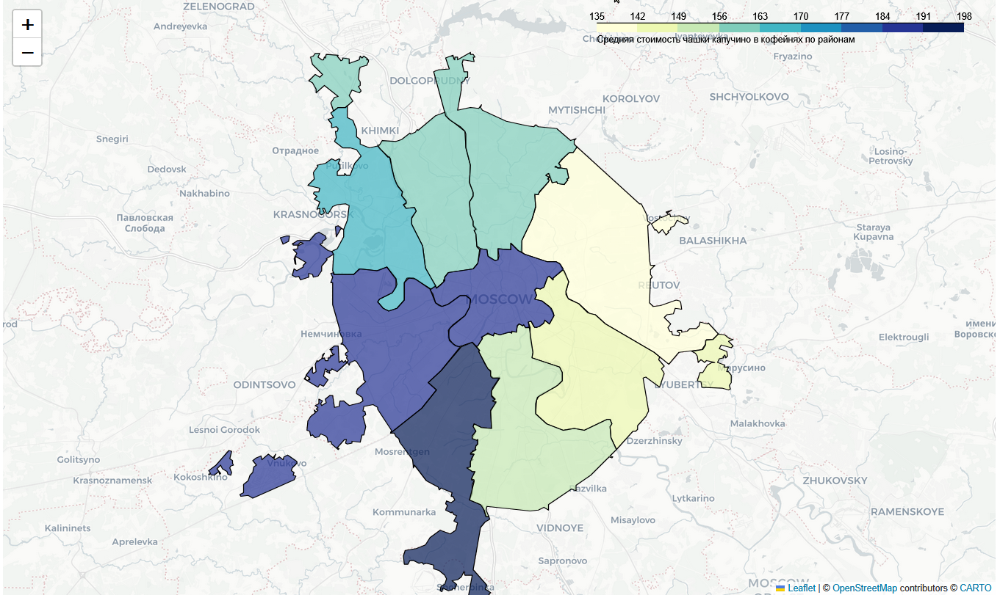

In [165]:
Choropleth(
    geo_data=state_geo_data,
    data=sortded_data_pivot_coffee_cup,
    columns=['district', 'middle_coffee_cup_median'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    legend_name='Средняя стоимость чашки капучино в кофейнях по районам',
    bins=9
).add_to(map_avg_coffee_cup)
# Для отображения карты в GitHub подгружаем ее в виде рисунка из локального места на ПК
Image(filename=r'C:\Users\Равиль\Проекты для портфолио\1. Проект по общепиту\map_avg_coffee_cup.png', \
      width=1000, height=600)

#### Построим диаграмму рассеяния зависимости средней стоимости чашки капучино от расстояния до центра Москвы

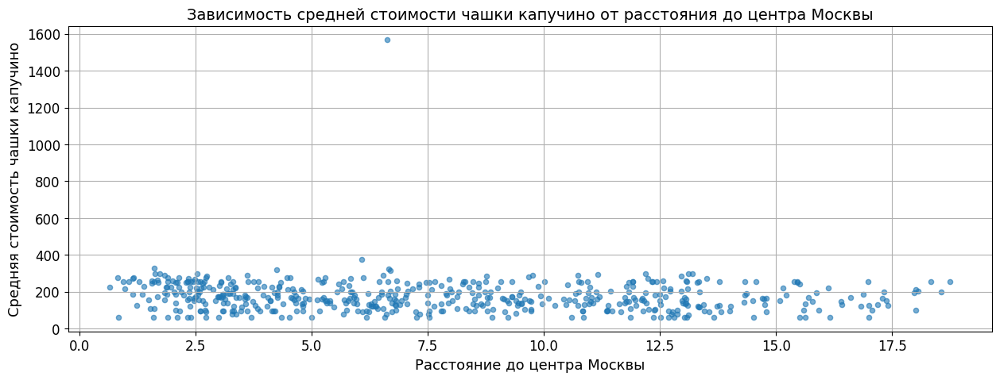

In [166]:
data_coffee_house.plot(x='distance', y='middle_coffee_cup', kind='scatter', figsize=(15, 5), alpha=0.6)
plt.ticklabel_format(style='plain')
plt.grid(True)
plt.title('Зависимость средней стоимости чашки капучино от расстояния до центра Москвы', fontsize=14)
plt.xlabel('Расстояние до центра Москвы', fontsize=13)
plt.ylabel('Средняя стоимость чашки капучино', fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

#### Посчитаем коэффициент корреляции Пирсона между средней стоимости чашки капучино и расстоянием до центра Москвы

In [167]:
round(data_coffee_house['distance'].corr(data_coffee_house['middle_coffee_cup']), 2)

-0.12

#### Выводы по исследованию кофеин

1. Всего в датасете представлено 1413 кофеин или 16.81% от общего количества заведений.
2. Больше всего расположено кофеин в центральном административном округе - 428 заведений или 30.29%. Меньше всего кофеин расположено в северо-западном административном округе - 62 заведения или 4.39%. Наибольшая плотность кофеин имеется в центре Москвы. С удалением от центра плотность как правило снижается. При этом в самом центре в районе Китай-города кофейни практически отсутствуют.
3. Среди представленных кофеин присутствуют 59 круглосуточных, что составляет 4.18% от общего количества
4. Максимальный средний рейтинг кофеин присутствует в центральном административном округе - 4.34. Минимальны рейтинг кофеин присутствует в западном административном округе - 4.2. Медианный рейтинг по всем кофейням составляет 4.3.
5. Медианная стоимость чашки капучино составляет 170 рублей. Максимальная средняя стоимость чашки капучино составляет 198 рублей и присутствует в юго-западном административном округе. Минимальная средняя стоимость чашки капучино составляет 135 рублей и присутствует в восточном административном округе. При этом зависимость между средней стоимостью чашки капучино и удалением от центра Москвы практически отсутствует.
6. Учитывая данные обстоятельства, при открытии кофейни имеет смысл ориентироваться на стоимость чашки капучино примерно в 170 рублей или чуть ниже, так как это медианная стоимость по рынку кофейн. Однако стоит учесть, что у нас есть информация по средней стоимости чашки капучино только для 521 заведения или 36.87% от всех кофейн.
7. Мы предлагаем открыть кофейню в юго-западном административном округе по следующим причинам:
- В данном районе представлено всего 96 заведений, что составляет всего 6.79% от общего количества кофеин. Это может позволить избежать высокой конкуренции по сравнению с другими районами.
- В данном районе самая высокая стоимость чашки капучино - 198 рублей. Наша задача предложить цену в 170 рублей, что должно позволить нам быть конкурентоспособными на рынке.
- Средний рейтинг кофейн составляет 4.28, что ниже медианного. В данном случае мы можем предложить лучшее обслуживание за счет чего предположительно можно повысить рейтинг нашего заведения.
8. Однако, для того, чтобы принять окончательное решение по выбору точного места заведения стоит дополнительно проанализировать рынок коммерческой недвижимости и выяснить стоимость аренды, а также проанализировать данные по проходимости предполагаемого места открытия.

## Общие выводы

### Проведенная работа над данными

1. Изучена общая информация о представленных данных.
2. В данных были проанализированы пропуски, которые были обработаны соответсвующим образом для последующего корректного анализа.
3. Были проанализированы и удалены дубликаты в данных.
4. Возможными причинами появления пропусков являются то, что информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Исходя из этого пользователи могли просто не внести все данные. Некоторые значения могут быть пропущены случайно, например, из-за ошибок при вводе данных или при экспорте данных из других источников. Неправильный запрос, объединение таблиц также может быть причиной.
5. Для удобства анализа в датафрейм были добавлены новые столбцы.

### Выводы по итогу анализа данных

1. В датафрейме имеется 8 категорий заведений из которых выделяются 3. Это кафе - 2377 заведений или 28.3%, рестораны - 2042 заведения или 24.3%, кофейни - 1413 заведений или 16.8%. Доля остальных категорий заведений не превышает 10%.
2. По медиане количества посадочных мест наибольшее значение имеется в категории рестораны - 86 мест. Далее идут бары-пабы - 82 места, кофейни - 80 мест. В кафе медиана значительно ниже - всего 60 мест.
3. В датафрейме больше представлено не сетевых заведений - 5201 заведение или 61,9% от общего количества. Наибольшая доля сетевых заведений представлена в булочных (61.33%), пиццериях (52.13%), кофейнях (50.96%).
4. Самая крупная сеть - это кофейни Шоколадница, которая имеет 119 точек. 6 из 15 топ сетей этой кофейни, что составляет 40%.
5. Среди всех районов большее количество заведений представлено в центральном административном округе - 2242 заведения или 26.68%. Меньше всех заведений представлено в северо-западном административном округе - 409 заведений или 4.87%.
6. Самый высокий средний рейтинг заведений у баров-пабов 4.39. Самый низкий рейтинг заведений у заведений быстрого питания - 4.05.
7. Медианный рейтинг заведений составляет 4.3. Самый высокий средний рейтинг заведений у баров-пабов 4.39. Самый низкий рейтинг заведений у заведений быстрого питания - 4.05.
8. Наибольшая плотность заведений расположена центре Москвы. При удалении от центра плотность заведений снижается.
9. Среди улиц на которых расположены заведения лидером по количеств является проспект Мира - 183 заведения или 2.19% от общего количества в датасете.
10. 457 заведений расположены на улицах где больше никого не представлено, что составляет 5.44% от общего числа.
11. Самый высокий средний чек в 1000 рублей присутствует у заведений в центральном и западном административном районе. Самый низкий средний чек в 450 рублей в юго-восточном административном округе. При этом зависимость между средним чеком заведения и расстоянием до центра Москвы практически отсутствует.
12. Среди заведений с плохим рейтингом от 3.5 и ниже наибольшая доля присутствует у кафе - 250 заведений или 49.41%. Далее идут рестораны - 79 заведений или 15.61%, быстрое питание 73 заведения или 14.43%, кофейни 49 заведений или 9.68%. Доля остальных заведений не превышает 5%. Средний чек таких заведений как правило ниже медианы среднего чека заведений всего датасета, однако говорить о четкой зависимости между средним чеком заведения и его рейтингом не приходится.

### Рекомендации по открытию кофейни

1.	При открытии кофейни имеет смысл ориентироваться на стоимость чашки капучино примерно в 170 рублей или чуть ниже, так как это медианная стоимость по рынку кофеин. Однако стоит учесть, что у нас есть информация по средней стоимости чашки капучино только для 521 заведения или 36.87% от всех кофеин.
2.	Мы предлагаем открыть кофейню в юго-западном административном округе по следующим причинам:
- В данном районе представлено всего 96 заведений, что составляет всего 6.79% от общего количества кофеин. Это может позволить избежать высокой конкуренции по сравнению с другими районами.
- В данном районе самая высокая стоимость чашки капучино - 198 рублей. Наша задача предложить цену в 170 рублей или немного ниже, что должно позволить нам быть конкурентоспособными на рынке.
- Средний рейтинг кофеин составляет 4.28, что ниже медианного. В данном случае мы можем предложить лучшее обслуживание за счет чего предположительно можно повысить рейтинг нашего заведения.
3.	Однако, для того, чтобы принять окончательное решение по выбору точного места заведения стоит дополнительно проанализировать рынок коммерческой недвижимости и выяснить стоимость аренды, а также проанализировать данные по проходимости предполагаемого места открытия.